# Graded Exercise 1: Extraction of Discriminative Features for Anomaly Detection on Acoustic Data

- **Course**: [CIVIL-426 - Machine Learning for Predictive Maintenance](https://edu.epfl.ch/coursebook/en/machine-learning-for-predictive-maintenance-applications-CIVIL-426)
- **Start Date**: 2024.09.19 at 10h15
- **Due Date**: 2024.10.02 at 23h59
- **Student 0**:
    - First and Last name: Sophea Bonne
    - SCIPER: 352901

- **Student 1**:
    - First and Last name: Joshua Cohen-Dumani
    - SCIPER: 311105

## Introduction

This notebook is divided in 2 parts:
- [Part 0](#part-0-demonstration): Demonstration on a toy dataset

This part shows how to extract discriminative features for anomaly detection on a toy 
dataset. This part of the notebook runs without any issues on a properly configured 
machine. You are **not** expected to fill anything in this part.

- [Part 1](#part-1-exercise): Graded exercise

This part contains the detailed questions and assignments of the graded exercise. You
are expected to fill this part with your own code and your own answers to the questions.

⚠️ The deadline to hand-in a PDF report along this complete notebook with 
[Part 1](#part-1-exercise) filled is **October 2nd, 2024 at 23h59**. No submissions 
will be accepted past this deadline. ⚠️

---

## Part 0: Demonstration

### 0. Introduction

The **goals** of this exercise are:

* Extracting statistical features of acoustic signals to discriminate between normal and abnormal samples
* Defining a threshold-based anomaly detection rule based on normal samples only

The **requirements** are:
* Your method can use a single feature or a combination of features
* You must include visualization in a meaningful way
* Your method must be developed based on the **TRAIN set** only

This part contains an example on a toy dataset.

1. **Train**: training set containing only healthy (normal) samples
2. **Test**: test set containing both normal and abnormal samples.

### 1. Notebook Configuration

In [1]:
# Packages for visualization
%pip install seaborn matplotlib-venn --upgrade --quiet
# Packages for feature extraction and machine learning
%pip install librosa numpy pandas scipy --upgrade --quiet


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [127]:
import librosa
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib_venn import venn2, venn3
import numpy as np
from numpy.fft import fft
import pandas as pd
import seaborn as sns
import scipy.stats as scist

# Matplotlib configuration for notebooks
%matplotlib inline


### 2. Load the Dataset 

In [3]:
# Load the dataset from your disk (you must have downloaded the file)
data = np.load("toy_data.npz")

# Extract the training and testing set
train_set = data["train"]
test_set = data["test"]

train_set_size = train_set.shape[0]
train_set_timesteps = train_set.shape[1]
test_set_size = test_set.shape[0]
test_set_timesteps = test_set.shape[1]


In [4]:
# About the train dataset
print(
    f"The TRAINING set contains {train_set_size} recordings. "
    f"Each recording contains {train_set_timesteps} samples."
)

# About the test dataset
print(
    f"The TESTING set contains {test_set_size} recordings. "
    f"Each recording contains {test_set_timesteps} samples."
)


The TRAINING set contains 500 recordings. Each recording contains 1000 samples.
The TESTING set contains 200 recordings. Each recording contains 1000 samples.


### 3. Visual Signals

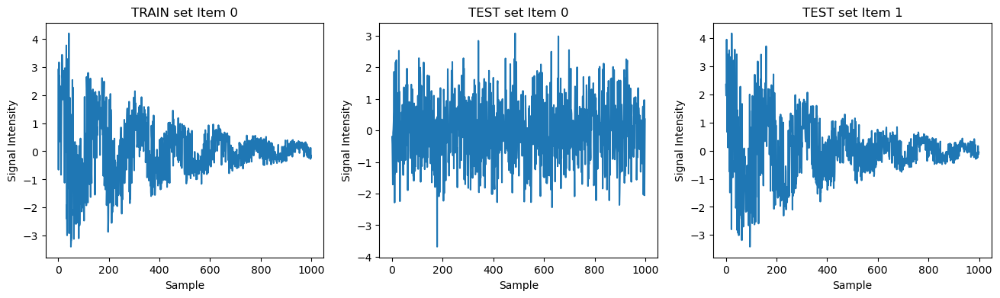

In [5]:
fig, ax = plt.subplots(1, 3, figsize=(16, 4))
ax[0].plot(train_set[0])
ax[0].set_title("TRAIN set Item 0")
ax[1].plot(test_set[0])
ax[1].set_title("TEST set Item 0")
ax[2].plot(test_set[1])
ax[2].set_title("TEST set Item 1")

for i in range(3):
    ax[i].set_xlabel("Sample")
    ax[i].set_ylabel("Signal Intensity")


### 4. Compute Absolute Values

In [6]:
train_set_abs = np.abs(train_set)
test_set_abs = np.abs(test_set)


### 5. Compute Min, Max, Centered Moments and Centralized Moments

In [7]:
# Compute moments 1 to 4 on the training set and assign them in a Pandas dataframe
data = pd.DataFrame(
    {
        "MaxAbs": np.amax(train_set_abs, axis=1),
        "Mean": np.mean(train_set, axis=1),
        "Variance": scist.moment(train_set, moment=2, axis=1, nan_policy="propagate"),
        "Skewness": scist.skew(train_set, axis=1, bias=True, nan_policy="propagate"),
        "Kurtosis": scist.kurtosis(
            train_set, axis=1, fisher=False, bias=True, nan_policy="propagate"
        ),
        "type": "train",
    }
)

# Compute moments 1 to 4 on the testing set and assign them in a Pandas dataframe
test_moments = pd.DataFrame(
    {
        "MaxAbs": np.amax(test_set_abs, axis=1),
        "Mean": np.mean(test_set, axis=1),
        "Variance": scist.moment(test_set, moment=2, axis=1, nan_policy="propagate"),
        "Skewness": scist.skew(test_set, axis=1, bias=True, nan_policy="propagate"),
        "Kurtosis": scist.kurtosis(
            test_set, axis=1, fisher=False, bias=True, nan_policy="propagate"
        ),
        "type": "test",
    }
)


### 6. Fourier Transform and Spectrum Skewness

In [8]:
# Remove DC compoent and calculate FFT
train_spectrum = 2.0 / train_set_size * np.abs(fft(train_set, axis=1, norm=None))
test_spectrum = 2.0 / test_set_size * np.abs(fft(test_set, axis=1, norm=None))

# Compute Skewness of the Sprectrum excluding the 0 [Hz] component
data["SpSkew"] = scist.skew(
    train_spectrum[:, 1:], axis=1, bias=True, nan_policy="propagate"
)
test_moments["SpSkew"] = scist.skew(
    test_spectrum[:, 1:], axis=1, bias=True, nan_policy="propagate"
)


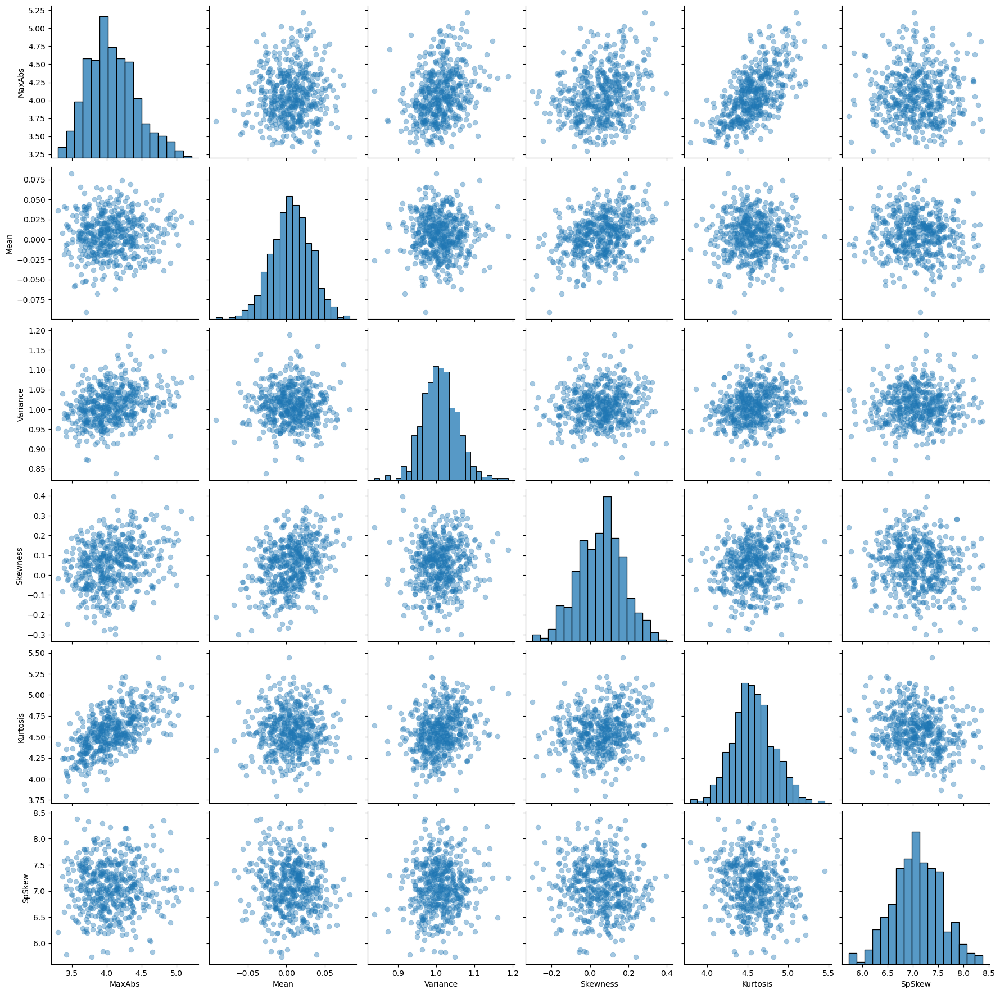

In [9]:
# If working on macOS, you want to specify that the diagonal plot should be histograms to avoid errors when plotting
# Otherwise you can leave the lines commented
sns.pairplot(
    data,
    vars=[c for c in data.columns if c != "type"],
    height=3,
    plot_kws={"alpha": 0.4, "s": 40, "edgecolor": None},
)
#            diag_kind = 'hist',
#           diag_kws = {'alpha': 0.4, 'log':True, 'density':True}
# )


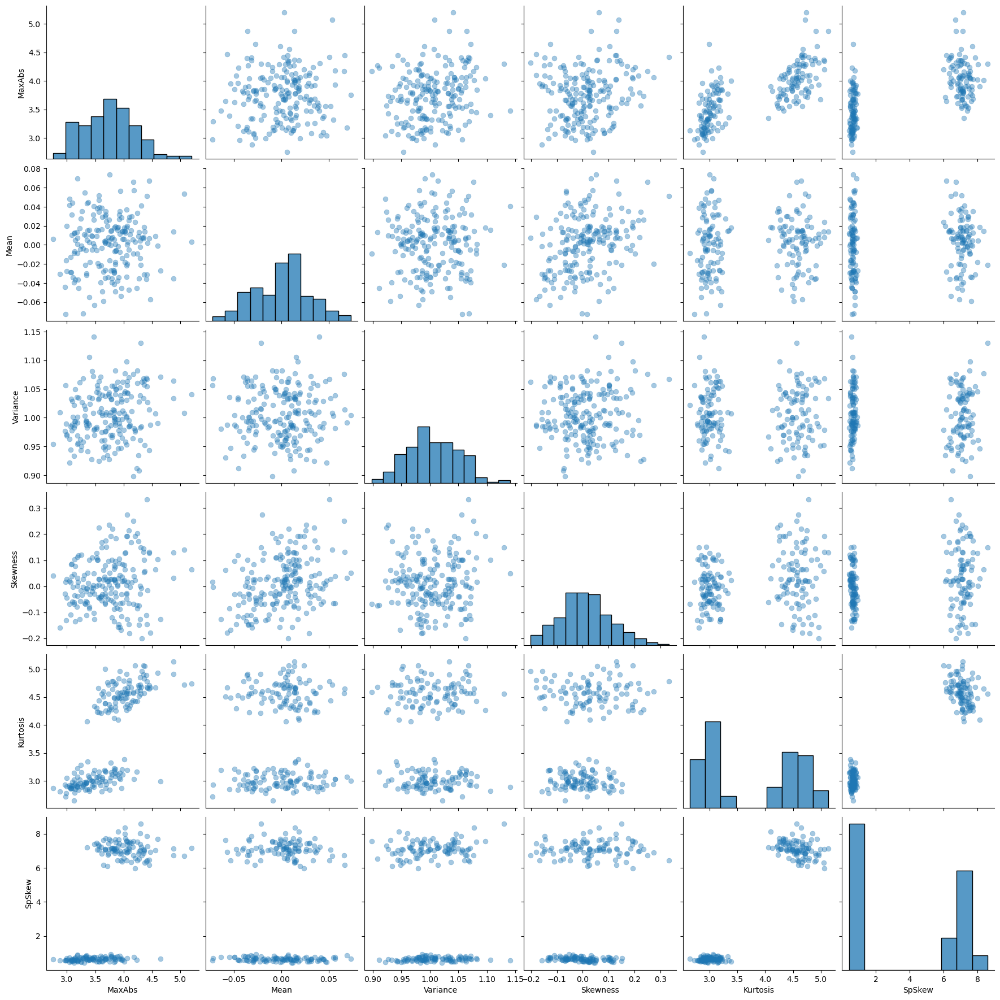

In [10]:
# If working on macOS, you want to specify that the diagonal plot should be histograms to avoid errors when plotting
# Otherwise you can leave the lines commented
sns.pairplot(
    test_moments,

    vars=[c for c in test_moments.columns if c != "type"],

    height=3,

    plot_kws={"alpha": 0.4, "s": 40, "edgecolor": None},
)
# ,
#            diag_kind = 'hist',
#           diag_kws = {'alpha': 0.4, 'log':True, 'density':True})


### 7. Defining thresholds based on normal data percentiles

Here, we define an anomaly detection rule based on thresholds, corresponding to the [0.5, 99.5] percentiles of the feature distributions of normal samples. In other words, a feature higher than 99.5% or lower than 0.5% of the normal features is considered an anomaly. Using only normal samples to base the decision is motivated by the facts that:

1. Few anomalies are observed
2. We cannot observe every possible anomaly

Anomalies are outliers with respect to the normal data distribution.

Text(0, 0.5, 'Percentile')

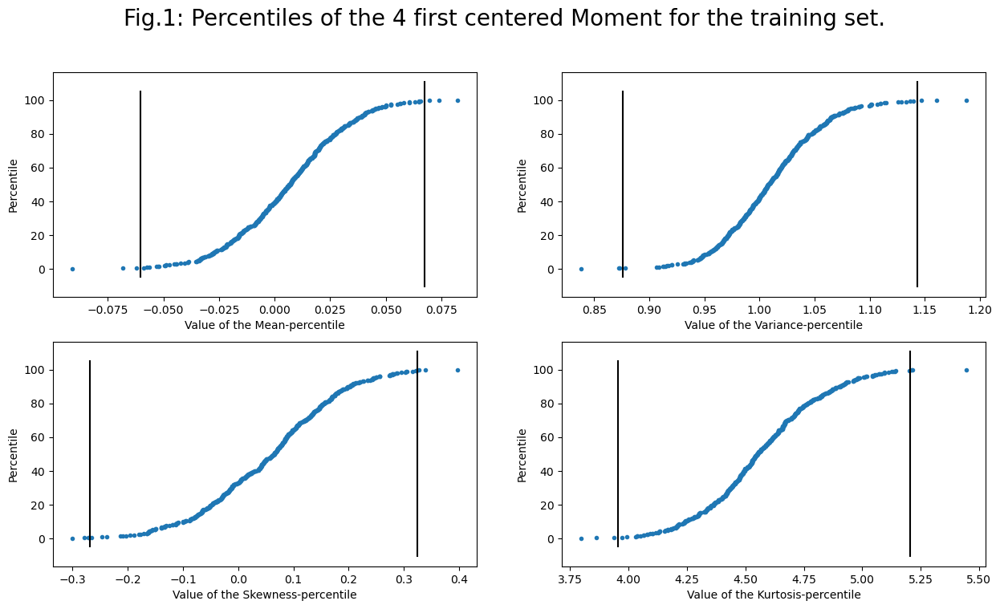

In [11]:
quantiles = [0.5, 99.5]
limit_max_abs = np.percentile(data.loc[:, "MaxAbs"], quantiles)
limit_mean = np.percentile(data.loc[:, "Mean"], quantiles)
limit_variance = np.percentile(data.loc[:, "Variance"], quantiles)
lim_skew = np.percentile(data.loc[:, "Skewness"], quantiles)
limit_kurtosis = np.percentile(data.loc[:, "Kurtosis"], quantiles)
limit_sp_skew = np.percentile(data.loc[:, "SpSkew"], quantiles)

train_percentage = np.linspace(0, 100, train_set_size)  # From 0% to 100%

plt.figure(1, figsize=(15, 8))
plt.clf()
plt.suptitle(
    "Fig.1: Percentiles of the 4 first centered Moment for the training set.",
    fontsize=20,
)
plt.subplot(2, 2, 1)
plt.plot(
    np.sort(data.loc[:, "Mean"]), train_percentage, marker=".", linewidth=0
)
plt.plot([limit_mean[0], limit_mean[0]], plt.ylim(), color="k")
plt.plot([limit_mean[1], limit_mean[1]], plt.ylim(), color="k")
plt.xlabel("Value of the Mean-percentile")
plt.ylabel("Percentile")
plt.subplot(2, 2, 2)
plt.plot(
    np.sort(data.loc[:, "Variance"]), train_percentage, marker=".", linewidth=0
)
plt.plot([limit_variance[0], limit_variance[0]], plt.ylim(), color="k")
plt.plot([limit_variance[1], limit_variance[1]], plt.ylim(), color="k")
plt.xlabel("Value of the Variance-percentile")
plt.ylabel("Percentile")
plt.subplot(2, 2, 3)
plt.plot(
    np.sort(data.loc[:, "Skewness"]), train_percentage, marker=".", linewidth=0
)
plt.plot([lim_skew[0], lim_skew[0]], plt.ylim(), color="k")
plt.plot([lim_skew[1], lim_skew[1]], plt.ylim(), color="k")
plt.xlabel("Value of the Skewness-percentile")
plt.ylabel("Percentile")
plt.subplot(2, 2, 4)
plt.plot(
    np.sort(data.loc[:, "Kurtosis"]), train_percentage, marker=".", linewidth=0
)
plt.plot([limit_kurtosis[0], limit_kurtosis[0]], plt.ylim(), color="k")
plt.plot([limit_kurtosis[1], limit_kurtosis[1]], plt.ylim(), color="k")
plt.xlabel("Value of the Kurtosis-percentile")
plt.ylabel("Percentile")


Text(0, 0.5, 'Percentile')

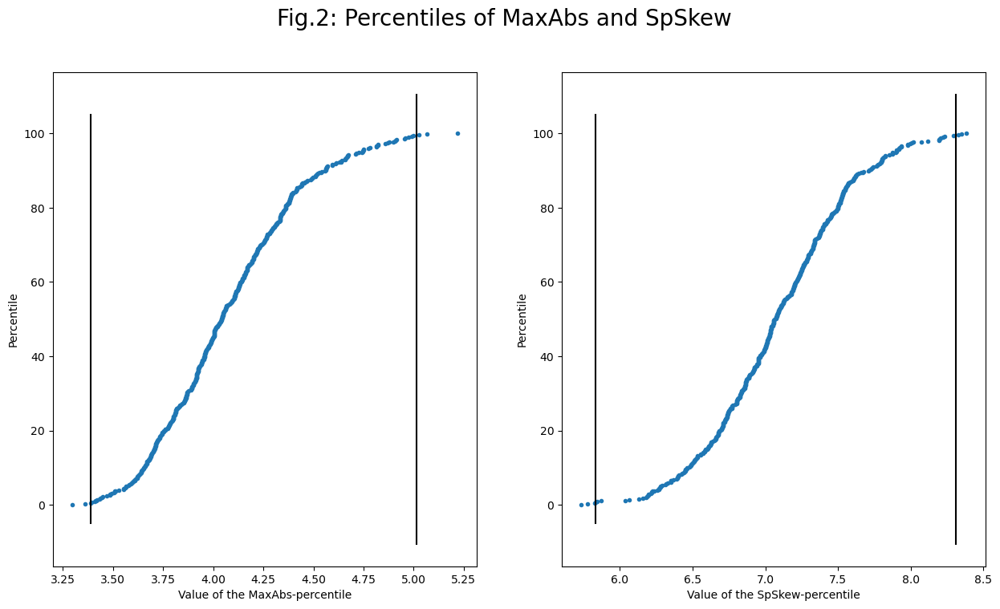

In [12]:
plt.figure(1, figsize=(15, 8))
plt.clf()
plt.suptitle("Fig.2: Percentiles of MaxAbs and SpSkew", fontsize=20)
plt.subplot(1, 2, 1)
plt.plot(np.sort(data.loc[:, "MaxAbs"]), train_percentage, marker=".", linewidth=0)
plt.plot([limit_max_abs[0], limit_max_abs[0]], plt.ylim(), color="k")
plt.plot([limit_max_abs[1], limit_max_abs[1]], plt.ylim(), color="k")
plt.xlabel("Value of the MaxAbs-percentile")
plt.ylabel("Percentile")
plt.subplot(1, 2, 2)
plt.plot(np.sort(data.loc[:, "SpSkew"]), train_percentage, marker=".", linewidth=0)
plt.plot([limit_sp_skew[0], limit_sp_skew[0]], plt.ylim(), color="k")
plt.plot([limit_sp_skew[1], limit_sp_skew[1]], plt.ylim(), color="k")
plt.xlabel("Value of the SpSkew-percentile")
plt.ylabel("Percentile")


Text(0, 0.5, 'Percentile')

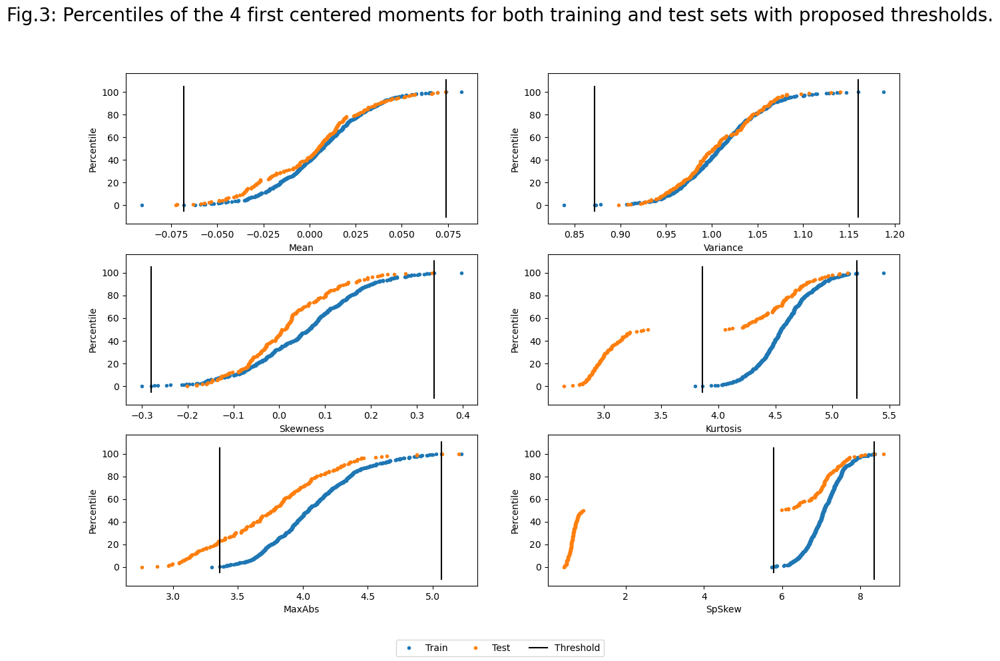

In [13]:
quantiles = [0.2, 99.8]
limit_max_abs = np.percentile(data.loc[:, "MaxAbs"], quantiles)
limit_mean = np.percentile(data.loc[:, "Mean"], quantiles)
limit_variance = np.percentile(data.loc[:, "Variance"], quantiles)
lim_skew = np.percentile(data.loc[:, "Skewness"], quantiles)
limit_kurtosis = np.percentile(data.loc[:, "Kurtosis"], quantiles)
limit_sp_skew = np.percentile(data.loc[:, "SpSkew"], quantiles)

test_percentage = np.linspace(0, 100, test_set_size)  # from 0% to 100% with step 100/nTrain

plt.figure(2, figsize=(15, 10))
plt.clf()
plt.suptitle(
    "Fig.3: Percentiles of the 4 first centered moments "
    + "for both training and test sets with proposed thresholds.",
    fontsize=20,
)
plt.subplot(3, 2, 1)
plt.plot(np.sort(data.loc[:, "Mean"]), train_percentage, marker=".", linewidth=0)
plt.plot(np.sort(test_moments.loc[:, "Mean"]), test_percentage, marker=".", linewidth=0)
plt.plot([limit_mean[0], limit_mean[0]], plt.ylim(), color="k")
plt.plot([limit_mean[1], limit_mean[1]], plt.ylim(), color="k")
plt.xlabel("Mean")
plt.ylabel("Percentile")

plt.subplot(3, 2, 2)
plt.plot(np.sort(data.loc[:, "Variance"]), train_percentage, marker=".", linewidth=0)
plt.plot(np.sort(test_moments.loc[:, "Variance"]), test_percentage, marker=".", linewidth=0)
plt.plot([limit_variance[0], limit_variance[0]], plt.ylim(), color="k")
plt.plot([limit_variance[1], limit_variance[1]], plt.ylim(), color="k")
plt.xlabel("Variance")
plt.ylabel("Percentile")

plt.subplot(3, 2, 3)
plt.plot(np.sort(data.loc[:, "Skewness"]), train_percentage, marker=".", linewidth=0)
plt.plot(np.sort(test_moments.loc[:, "Skewness"]), test_percentage, marker=".", linewidth=0)
plt.plot([lim_skew[0], lim_skew[0]], plt.ylim(), color="k")
plt.plot([lim_skew[1], lim_skew[1]], plt.ylim(), color="k")
plt.xlabel("Skewness")
plt.ylabel("Percentile")
# plt.xlim([-50,50])

plt.subplot(3, 2, 4)
plt.plot(np.sort(data.loc[:, "Kurtosis"]), train_percentage, marker=".", linewidth=0)
plt.plot(np.sort(test_moments.loc[:, "Kurtosis"]), test_percentage, marker=".", linewidth=0)
plt.plot([limit_kurtosis[0], limit_kurtosis[0]], plt.ylim(), color="k")
plt.plot([limit_kurtosis[1], limit_kurtosis[1]], plt.ylim(), color="k")
plt.xlabel("Kurtosis")
plt.ylabel("Percentile")
# plt.xlim([-50,5000])
plt.figlegend(
    ["Train", "Test", "Threshold"], loc="lower center", ncol=5, labelspacing=0.0
)

plt.subplot(3, 2, 5)
plt.plot(np.sort(data.loc[:, "MaxAbs"]), train_percentage, marker=".", linewidth=0)
plt.plot(np.sort(test_moments.loc[:, "MaxAbs"]), test_percentage, marker=".", linewidth=0)
plt.plot([limit_max_abs[0], limit_max_abs[0]], plt.ylim(), color="k")
plt.plot([limit_max_abs[1], limit_max_abs[1]], plt.ylim(), color="k")
plt.xlabel("MaxAbs")
plt.ylabel("Percentile")

plt.subplot(3, 2, 6)
plt.plot(np.sort(data.loc[:, "SpSkew"]), train_percentage, marker=".", linewidth=0)
plt.plot(np.sort(test_moments.loc[:, "SpSkew"]), test_percentage, marker=".", linewidth=0)
plt.plot([limit_sp_skew[0], limit_sp_skew[0]], plt.ylim(), color="k")
plt.plot([limit_sp_skew[1], limit_sp_skew[1]], plt.ylim(), color="k")
plt.xlabel("SpSkew")
plt.ylabel("Percentile")


In [14]:
np.where(data.loc[:, "Mean"] < limit_mean[0])

(array([275]),)

In [15]:
# select points either below 0.5 percentile or above 99.5 percentile of each moments and min-max limits
abn_train_mean = np.where(
    (data.loc[:, "Mean"] < limit_mean[0])
    | (data.loc[:, "Mean"] > limit_mean[1])
)[0]
abn_train_variance = np.where(
    (data.loc[:, "Variance"] < limit_variance[0])
    | (data.loc[:, "Variance"] > limit_variance[1])
)[0]
abn_train_skew = np.where(
    (data.loc[:, "Skewness"] < lim_skew[0])
    | (data.loc[:, "Skewness"] > lim_skew[1])
)[0]
abn_train_kurtosis = np.where(
    (data.loc[:, "Kurtosis"] < limit_kurtosis[0])
    | (data.loc[:, "Kurtosis"] > limit_kurtosis[1])
)[0]

abn_train_max_abs = np.where(
    (data.loc[:, "MaxAbs"] < limit_max_abs[0])
    | (data.loc[:, "MaxAbs"] > limit_max_abs[1])
)[0]
abn_train_sp_skew = np.where(
    (data.loc[:, "SpSkew"] < limit_sp_skew[0])
    | (data.loc[:, "SpSkew"] > limit_sp_skew[1])
)[0]

all_abnormalities_train = np.unique(
    np.concatenate(
        (
            abn_train_mean,
            abn_train_variance,
            abn_train_skew,
            abn_train_kurtosis,
            abn_train_max_abs,
            abn_train_sp_skew,
        )
    )
)

# Compare sets together. Loop over each pair of sets and compute how many IDs they have in common
train_dict = {
    "Mean": abn_train_mean,
    "Variance": abn_train_variance,
    "Skewness": abn_train_skew,
    "Kurtsosis": abn_train_kurtosis,
    "MaxAbs": abn_train_max_abs,
    "SpSkew": abn_train_sp_skew,
}
train_dict_keys = list(train_dict.keys())

print("TRAINING DATASET")
for i in range(train_dict.__len__()):
    k1 = train_dict_keys[i]
    print("{}: {} anomalies found.".format(k1, train_dict[k1].__len__()))

anomalies_count_train = np.array(
    [np.sum([i in train_dict[k] for k in train_dict]) for i in range(train_set_size)]
)
for i in range(1, 5):
    print(
        "{} samples are found as anomalous by at least {} selection methods.".format(
            len(np.where(anomalies_count_train >= i)[0]), i
        )
    )

######################################################################################################

# select points either below 0.2 percentile or above 99.8 percentile of each moments and min-max limits
abn_test_mean = np.where(
    (test_moments.loc[:, "Mean"] < limit_mean[0])
    | (test_moments.loc[:, "Mean"] > limit_mean[1])
)[0]
abn_test_variance = np.where(
    (test_moments.loc[:, "Variance"] < limit_variance[0])
    | (test_moments.loc[:, "Variance"] > limit_variance[1])
)[0]
abn_test_skew = np.where(
    (test_moments.loc[:, "Skewness"] < lim_skew[0])
    | (test_moments.loc[:, "Skewness"] > lim_skew[1])
)[0]
abn_test_kurtosis = np.where(
    (test_moments.loc[:, "Kurtosis"] < limit_kurtosis[0])
    | (test_moments.loc[:, "Kurtosis"] > limit_kurtosis[1])
)[0]

abn_test_max_abs = np.where(
    (test_moments.loc[:, "MaxAbs"] < limit_max_abs[0])
    | (test_moments.loc[:, "MaxAbs"] > limit_max_abs[1])
)[0]
abn_test_sp_skew = np.where(
    (test_moments.loc[:, "SpSkew"] < limit_sp_skew[0])
    | (test_moments.loc[:, "SpSkew"] > limit_sp_skew[1])
)[0]

allAbnormalities = np.unique(
    np.concatenate(
        (
            abn_test_mean,
            abn_test_variance,
            abn_test_skew,
            abn_test_kurtosis,
            abn_test_max_abs,
            abn_test_sp_skew,
        )
    )
)


# compare sets together. Here I loop over each pair of set and compute how many ID they have in common
test_dict = {
    "Mean": abn_test_mean,
    "Variance": abn_test_variance,
    "Skewness": abn_test_skew,
    "Kurtosis": abn_test_kurtosis,
    "MaxAbs": abn_test_max_abs,
    "SpSkew": abn_test_sp_skew,
}
keysTest = list(test_dict.keys())


print("\nTEST DATASET")
for ii in range(test_dict.__len__()):
    k1 = keysTest[ii]
    print(f"{k1}: {len(test_dict[k1])} anomalies found.")

countAbnormalTest = np.array(
    [np.sum([i in test_dict[k] for k in test_dict]) for i in range(test_set_size)]
)
for i in range(1, 5):
    print(
        f"{len(np.where(countAbnormalTest >= i)[0])} samples are found as anomalous "
        f"by at least {i} selection methods."
    )


TRAINING DATASET
Mean: 2 anomalies found.
Variance: 2 anomalies found.
Skewness: 2 anomalies found.
Kurtsosis: 2 anomalies found.
MaxAbs: 2 anomalies found.
SpSkew: 2 anomalies found.
12 samples are found as anomalous by at least 1 selection methods.
0 samples are found as anomalous by at least 2 selection methods.
0 samples are found as anomalous by at least 3 selection methods.
0 samples are found as anomalous by at least 4 selection methods.

TEST DATASET
Mean: 2 anomalies found.
Variance: 0 anomalies found.
Skewness: 0 anomalies found.
Kurtosis: 100 anomalies found.
MaxAbs: 48 anomalies found.
SpSkew: 102 anomalies found.
105 samples are found as anomalous by at least 1 selection methods.
100 samples are found as anomalous by at least 2 selection methods.
45 samples are found as anomalous by at least 3 selection methods.
2 samples are found as anomalous by at least 4 selection methods.


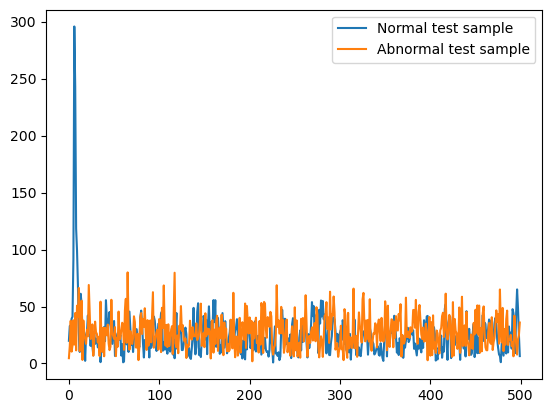

In [16]:
fft = np.abs(np.fft.fft(train_set[1]))[: train_set_timesteps // 2]
plt.plot(fft, label="Normal test sample")
fft = np.abs(np.fft.fft(test_set[0]))[: test_set_timesteps // 2]
plt.plot(fft, label="Abnormal test sample")
plt.legend()


Text(0.5, 1.0, 'Test dataset')

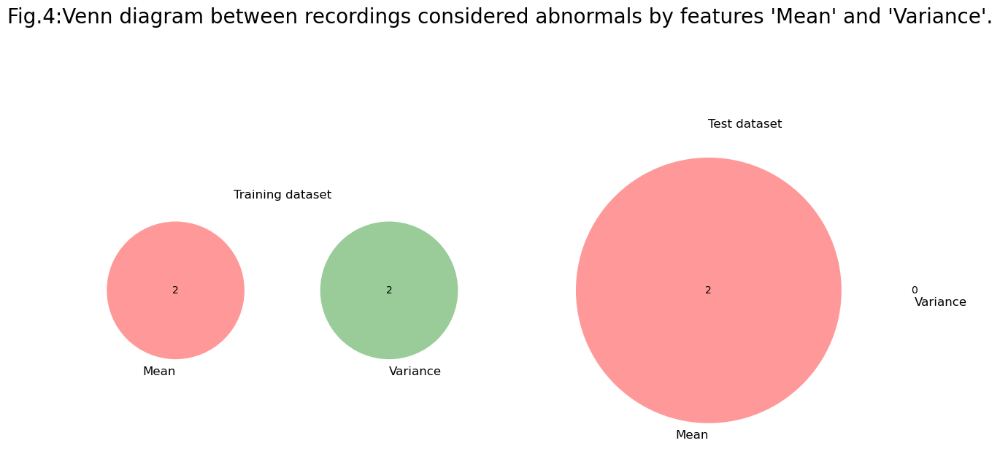

In [17]:
plt.figure(3, figsize=(15, 8))
plt.clf()
plt.suptitle(
    "Fig.4:Venn diagram between recordings considered abnormals by features 'Mean' and 'Variance'.",
    fontsize=20,
)

loc_train_mean = (data.loc[:, "Mean"] < limit_mean[0]) | (
    data.loc[:, "Mean"] > limit_mean[1]
)
loc_train_variance = (data.loc[:, "Variance"] < limit_variance[0]) | (
    data.loc[:, "Variance"] > limit_variance[1]
)
a1 = np.sum(loc_train_mean & loc_train_variance)
a2 = np.sum(loc_train_mean & ~loc_train_variance)
a3 = np.sum(~loc_train_mean & loc_train_variance)

plt.subplot(121)
venn2(subsets=(a2, a3, a1), set_labels=("Mean", "Variance"))
plt.title("Training dataset")


loc_test_mean = (test_moments.loc[:, "Mean"] < limit_mean[0]) | (
    test_moments.loc[:, "Mean"] > limit_mean[1]
)
loc_test_variance = (test_moments.loc[:, "Variance"] < limit_variance[0]) | (
    test_moments.loc[:, "Variance"] > limit_variance[1]
)
a1 = np.sum(loc_test_mean & loc_test_variance)
a2 = np.sum(loc_test_mean & ~loc_test_variance)
a3 = np.sum(~loc_test_mean & loc_test_variance)


plt.subplot(122)
venn2(subsets=(a2, a3, a1), set_labels=("Mean", "Variance"))
plt.title("Test dataset")


Text(0.5, 1.0, 'Test dataset')

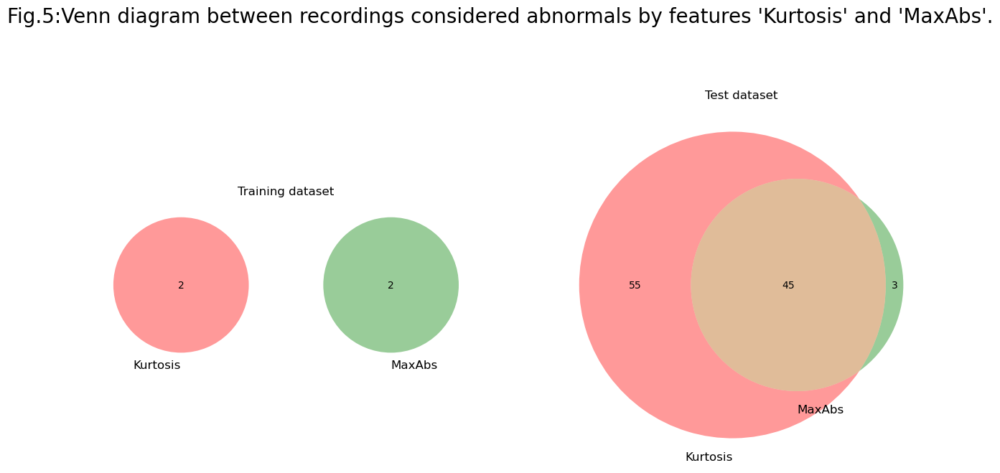

In [18]:
plt.figure(3, figsize=(15, 8))
plt.clf()
plt.suptitle(
    "Fig.5:Venn diagram between recordings considered abnormals by features 'Kurtosis' and 'MaxAbs'.",
    fontsize=20,
)

loc_train_kurtosis = (data.loc[:, "Kurtosis"] < limit_kurtosis[0]) | (
    data.loc[:, "Kurtosis"] > limit_kurtosis[1]
)
loc_train_max_abs = (data.loc[:, "MaxAbs"] < limit_max_abs[0]) | (
    data.loc[:, "MaxAbs"] > limit_max_abs[1]
)
a1 = np.sum(loc_train_kurtosis & loc_train_max_abs)
a2 = np.sum(loc_train_kurtosis & ~loc_train_max_abs)
a3 = np.sum(~loc_train_kurtosis & loc_train_max_abs)

plt.subplot(121)
venn2(subsets=(a2, a3, a1), set_labels=("Kurtosis", "MaxAbs"))
plt.title("Training dataset")


loc_test_kurtosis = (test_moments.loc[:, "Kurtosis"] < limit_kurtosis[0]) | (
    test_moments.loc[:, "Kurtosis"] > limit_kurtosis[1]
)
loc_test_max_abs = (test_moments.loc[:, "MaxAbs"] < limit_max_abs[0]) | (
    test_moments.loc[:, "MaxAbs"] > limit_max_abs[1]
)
a1 = np.sum(loc_test_kurtosis & loc_test_max_abs)
a2 = np.sum(loc_test_kurtosis & ~loc_test_max_abs)
a3 = np.sum(~loc_test_kurtosis & loc_test_max_abs)


plt.subplot(122)
venn2(subsets=(a2, a3, a1), set_labels=("Kurtosis", "MaxAbs"))
plt.title("Test dataset")


Text(0.5, 1.0, 'Test dataset')

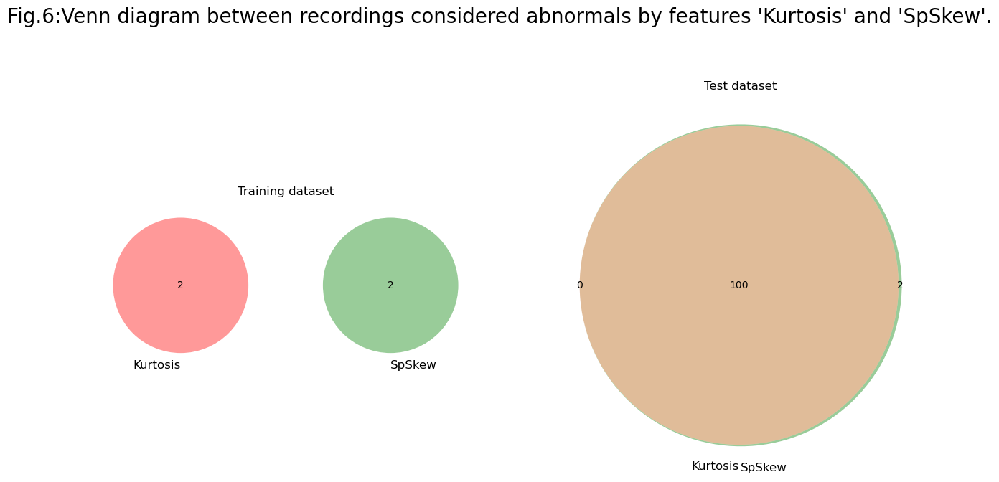

In [19]:
plt.figure(3, figsize=(15, 8))
plt.clf()
plt.suptitle(
    "Fig.6:Venn diagram between recordings considered abnormals by features 'Kurtosis' and 'SpSkew'.",
    fontsize=20,
)

loc_train_kurtosis = (data.loc[:, "Kurtosis"] < limit_kurtosis[0]) | (
    data.loc[:, "Kurtosis"] > limit_kurtosis[1]
)
loc_train_sp_skew = (data.loc[:, "SpSkew"] < limit_sp_skew[0]) | (
    data.loc[:, "SpSkew"] > limit_sp_skew[1]
)
a1 = np.sum(loc_train_kurtosis & loc_train_sp_skew)
a2 = np.sum(loc_train_kurtosis & ~loc_train_sp_skew)
a3 = np.sum(~loc_train_kurtosis & loc_train_sp_skew)

plt.subplot(121)
venn2(subsets=(a2, a3, a1), set_labels=("Kurtosis", "SpSkew"))
plt.title("Training dataset")


loc_test_kurtosis = (test_moments.loc[:, "Kurtosis"] < limit_kurtosis[0]) | (
    test_moments.loc[:, "Kurtosis"] > limit_kurtosis[1]
)
loc_test_sp_skew = (test_moments.loc[:, "SpSkew"] < limit_sp_skew[0]) | (
    test_moments.loc[:, "SpSkew"] > limit_sp_skew[1]
)
a1 = np.sum(loc_test_kurtosis & loc_test_sp_skew)
a2 = np.sum(loc_test_kurtosis & ~loc_test_sp_skew)
a3 = np.sum(~loc_test_kurtosis & loc_test_sp_skew)


plt.subplot(122)
venn2(subsets=(a2, a3, a1), set_labels=("Kurtosis", "SpSkew"))
plt.title("Test dataset")


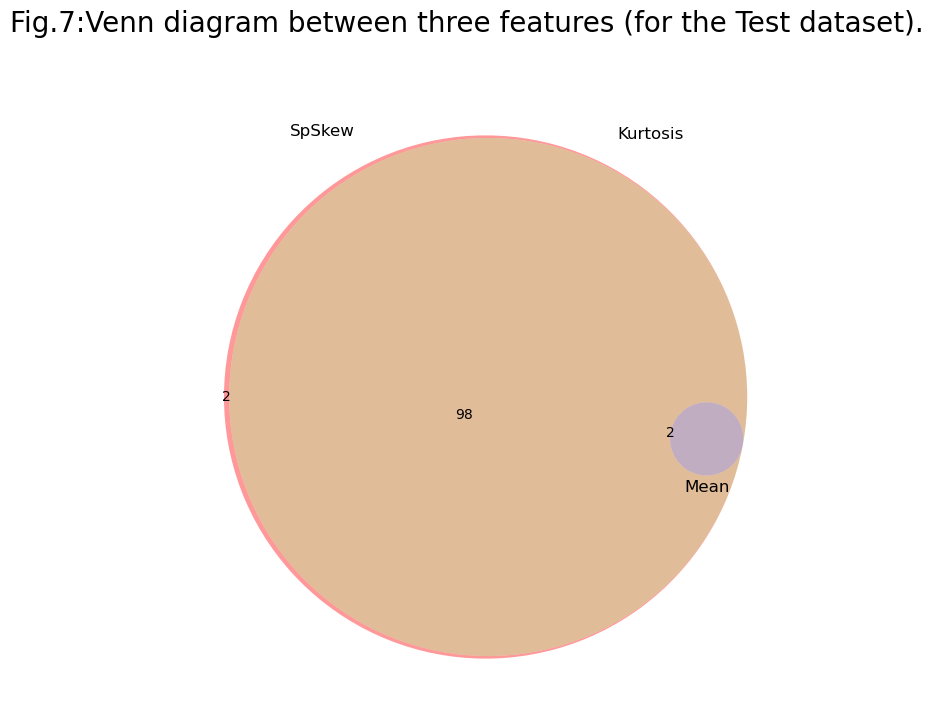

In [20]:
loc_test_kurtosis = (test_moments.loc[:, "Kurtosis"] < limit_kurtosis[0]) | (
    test_moments.loc[:, "Kurtosis"] > limit_kurtosis[1]
)
loc_test_mean = (test_moments.loc[:, "Mean"] < limit_mean[0]) | (
    test_moments.loc[:, "Mean"] > limit_mean[1]
)
loc_test_sp_skew = (test_moments.loc[:, "SpSkew"] < limit_sp_skew[0]) | (
    test_moments.loc[:, "SpSkew"] > limit_sp_skew[1]
)

a1 = np.sum((loc_test_sp_skew & ~loc_test_kurtosis) & ~loc_test_mean)
a2 = np.sum((~loc_test_sp_skew & loc_test_kurtosis) & ~loc_test_mean)
a3 = np.sum((loc_test_sp_skew & loc_test_kurtosis) & ~loc_test_mean)
a4 = np.sum((~loc_test_sp_skew & ~loc_test_kurtosis) & loc_test_mean)
a5 = np.sum((loc_test_sp_skew & ~loc_test_kurtosis) & loc_test_mean)
a6 = np.sum((~loc_test_sp_skew & loc_test_kurtosis) & loc_test_mean)
a7 = np.sum((loc_test_sp_skew & loc_test_kurtosis) & loc_test_mean)

plt.figure(4, figsize=(15, 8))
plt.clf()
plt.suptitle(
    "Fig.7:Venn diagram between three features (for the Test dataset).", fontsize=20
)

venn3(subsets=(a1, a2, a3, a4, a5, a6, a7), set_labels=("SpSkew", "Kurtosis", "Mean"))


---

## Part 1: Exercise

⚠️ **This part contains the actual graded exercise 1 questions.** ⚠️

Find your own features for a real acoustic dataset from industrial machines!

Acoustic emission and vibration monitoring play integral roles in structural health 
monitoring (SHM) by providing crucial insights into the condition and integrity of 
structures. Acoustic Emission involves the detection of transient stress waves or 
acoustic signals emitted by materials when they undergo deformation or damage. Vibration 
monitoring with accelerometers is widely used to assess the structural integrity of 
various systems, from bridges and buildings to rotating machinery. Vibration analysis 
can reveal changes in natural frequencies, mode shapes, and damping characteristics, 
which can be indicative of structural damage or degradation. 

### Dataset Description

For this exercise, we consider acoustic emissions from two machines: a **pump** and a 
**valve**. The datasets come as follows:

* **pump**
    * train set containing data from pump in good working conditions
    * test set containing both healthy data and data from pumps with abnormal behaviors
* **valve**
    * train set containing data from valve in good working conditions
    * test set containing both healthy data and data from valves with abnormal behaviors

### Problem Description

Using features introduced in [Part 0](#part-0-demonstration), other features presented 
during lectures and previous exercises, or any other features you deem useful, your goal
is to identify features that can uncover anomalies present in the test dataset but not 
present in the training dataset. Selected features will be different for the pump and 
valve.

### Questions

**Question 1:** Generate plots of raw signals, FFT spectrums or spectrogram from the 
healthy data of both the pump and valve acoustic signals. Discuss the distinctions 
between the signals emitted by these two machines.

Questions 2, 3 and 4 have to be answered separately for both the pump and valve datasets.

**Question 2:** Visualize the raw signals, spectrum, and spectrograms of the test 
dataset for the pump/valve dataset. Are there any signals that appear abnormal to you?

**Question 3:** Compute basic statistical features (mean, variance, skewness, and 
kurtosis) for both the training and test datasets of the pump and valve. Are there any 
abnormal signals that you can detect?

**Question 4:** Find by yourself a feature or a combination of feature that help to 
uncover signals with abnormal behavior. Analyze whether the selected features trigger 
alarms for similar behavior or if some are specific to particular anomalies.

**Question 5:** What are some potential limitations of the method suggested in this 
exercise for anomaly detection? Answer with at least 3 limitations.

**Question 6:** Now that you have developed a set of features and thresholds for a 
valve/pump, imagine applying them to a different valve/pump. Would the discriminative 
power change? If so, how do you propose to mitigate it? Justify and provide concrete 
details.

**Question 7:** Now imagine you're in a scenario where the are no anomalous samples 
available. How would you tackle this problem? Answer with an overview of your proposed 
approach and then provide concrete details regarding the method.


The answers to those questions are expected in a **PDF report**. The full Jupyter notebook 
must also be submitted. A PDF report without any description, analysis, and discussion 
around the plots will not be considered valid.

### Critical Points & Requirements

Here is a unorded non-exhaustive list of some critical points which will be taken into 
account for grading:
- Quality of the plots (legend, axes labels, plot titles, units, ...)
- Discriminative power of the selected features (performance) on the `valve` dataset
- Discriminative power of the selected features (performance) on the `pump` dataset
- Quality of the scientific reasoning
- Structure, clarity, and conciseness of the report
- Quality of the code (useful but concise documentation, clarity of the code, ...)
- ...

⚠️ Your submitted notebook should be able to run on a properly configured environment
(*c.f.* week 1 exercises). If you require additional packages, make sure to add a 
`pip install` command in a code cell (example in the following cell to install `gdown`.)

### 0. Download the Dataset

``gdown`` is a Python library and command-line tool that simplifies the process of downloading files from Google Drive.

In [21]:
%pip install gdown --upgrade --quiet
import gdown


Note: you may need to restart the kernel to use updated packages.


In [22]:
# Pump dataset
gdown.download(id="1Vz1fhpu5xKJ4RI5maJh_3OweX9BpjBaM", output="./pump.zip")


Downloading...
From (original): https://drive.google.com/uc?id=1Vz1fhpu5xKJ4RI5maJh_3OweX9BpjBaM
From (redirected): https://drive.google.com/uc?id=1Vz1fhpu5xKJ4RI5maJh_3OweX9BpjBaM&confirm=t&uuid=c18e4e07-aa5a-4e7c-bb3d-b72f62578b1c
To: /Users/joshuacohendumani/Documents/EPFL/Master/MA3/ML4PM/ml4pm/pump.zip
100%|██████████| 100M/100M [00:01<00:00, 50.4MB/s] 


'./pump.zip'

In [23]:
# Valve dataset
gdown.download(id="13bzdjL0gEc9hsGHjr0Qo8OMcMF5CrYbS", output="./valve.zip")


Downloading...
From (original): https://drive.google.com/uc?id=13bzdjL0gEc9hsGHjr0Qo8OMcMF5CrYbS
From (redirected): https://drive.google.com/uc?id=13bzdjL0gEc9hsGHjr0Qo8OMcMF5CrYbS&confirm=t&uuid=c3b15d5a-8490-4278-a985-768c579d321c
To: /Users/joshuacohendumani/Documents/EPFL/Master/MA3/ML4PM/ml4pm/valve.zip
100%|██████████| 177M/177M [00:03<00:00, 44.7MB/s] 


'./valve.zip'

### 1. Extract the Datasets

In [24]:
import zipfile
import os

# List all ZIP files in the current directory
zip_files = [file for file in os.listdir() if file.endswith(".zip")]

# Loop through each ZIP file and unzip it in the same directory
for zip_file in zip_files:
    with zipfile.ZipFile(zip_file, "r") as zip_ref:
        zip_ref.extractall()


### 2. Load the Audio Data

In this code cell, we are using the `librosa` library to load audio files from two 
directories: `/valve` and `/pump`. The goal is to prepare audio data for further 
analysis or processing.


In [25]:
def load_wav_files(directory: str) -> np.ndarray:
    """Load all .WAV audio files in a directory as a 2D Numpy array

    Args:
        directory (str): Path to the directory containing the audio files

    Returns:
        np.ndarray: Loaded audio files as a 2D array
    """
    audio_data: list = []

    # Iterate through files in the directory
    for filename in os.listdir(directory):
        if filename.endswith(".wav") or filename.endswith(".WAV"):
            file_path = os.path.join(directory, filename)

            # Load audio file and append it to the list
            audio, sr = librosa.load(file_path, sr=None)
            audio_data.append(audio)

    return np.array(audio_data)


# Paths to the "valve" and "pump" directories
valve_directory = "./valve"
pump_directory = "./pump"

# Load audio data for "valve" and "pump"
valve_train_data = load_wav_files(os.path.join(valve_directory, "train"))
valve_test_data = load_wav_files(os.path.join(valve_directory, "test"))
pump_train_data = load_wav_files(os.path.join(pump_directory, "train"))
pump_test_data = load_wav_files(os.path.join(pump_directory, "test"))


In [26]:
print(f"Valve Train Data Shape: {valve_train_data.shape}")
print(f"Valve Test Data Shape: {valve_test_data.shape}")
print(f"Pump Train Data Shape: {pump_train_data.shape}")
print(f"Pump Test Data Shape: {pump_test_data.shape}")


Valve Train Data Shape: (500, 160000)
Valve Test Data Shape: (219, 160000)
Pump Train Data Shape: (200, 160000)
Pump Test Data Shape: (200, 160000)


⚠️ **You're expected to fill the notebook from here.** ⚠️

# Question 1: 
### Generate plots of raw signals, FFT spectrums or spectrogram from the healthy data of both the pump and valve acoustic signals. Discuss the distinctions between the signals emitted by these two machines.


Let's first visualize the raw signal of a couple elements in the valve dataset:

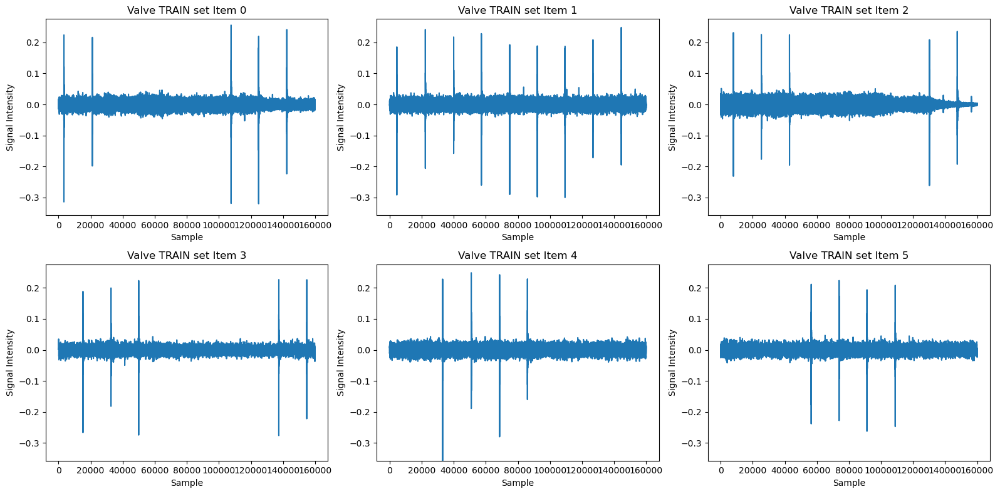

In [27]:
fig, ax = plt.subplots(2, 3, figsize=(16, 8))

global_min = min(data.min() for data in valve_train_data)
global_max = max(data.max() for data in valve_train_data)

for i in range(6):
    ax[i // 3, i % 3].plot(valve_train_data[i]) 
    ax[i // 3, i % 3].set_title(f"Valve TRAIN set Item {i}")
    ax[i // 3, i % 3].set_xlabel("Sample")
    ax[i // 3, i % 3].set_ylabel("Signal Intensity")
    ax[i // 3, i % 3].set_ylim(global_min, global_max)  # Set the same y-axis limits for all plots

plt.tight_layout()
plt.show()

Now, let's do the same for the pump raw signals:

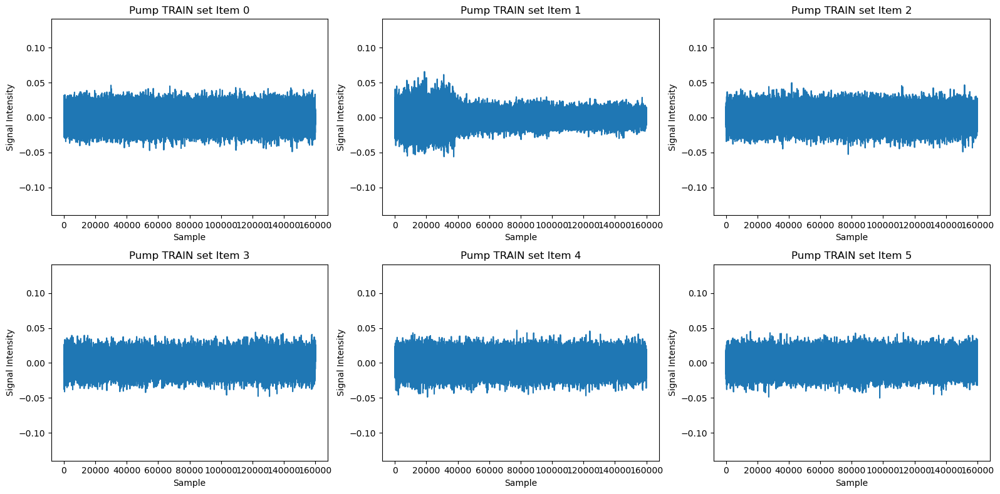

In [28]:
fig, ax = plt.subplots(2, 3, figsize=(16, 8))

global_min = min(data.min() for data in pump_train_data)
global_max = max(data.max() for data in pump_train_data)

for i in range(6):
    ax[i // 3, i % 3].plot(pump_train_data[i]) 
    ax[i // 3, i % 3].set_title(f"Pump TRAIN set Item {i}")
    ax[i // 3, i % 3].set_xlabel("Sample")
    ax[i // 3, i % 3].set_ylabel("Signal Intensity")
    ax[i // 3, i % 3].set_ylim(global_min, global_max)  # Set the same y-axis limits for all plots

plt.tight_layout()
plt.show()

Let's see what these samples sound like:

In [29]:
from IPython.display import Audio
# Valve audio
Audio(data=valve_train_data[0], rate = 22050)

In [30]:
# Pump audio
Audio(data=pump_train_data[0], rate = 22050)

Let's now plot the fast fourier transform of these signals, to get a better understanding of the frequency profile of the valve and pump.

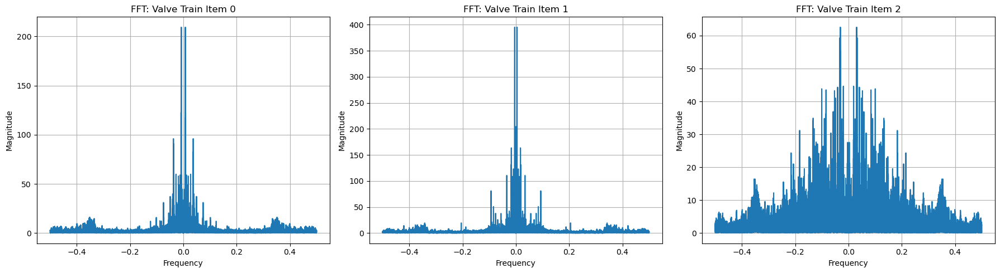

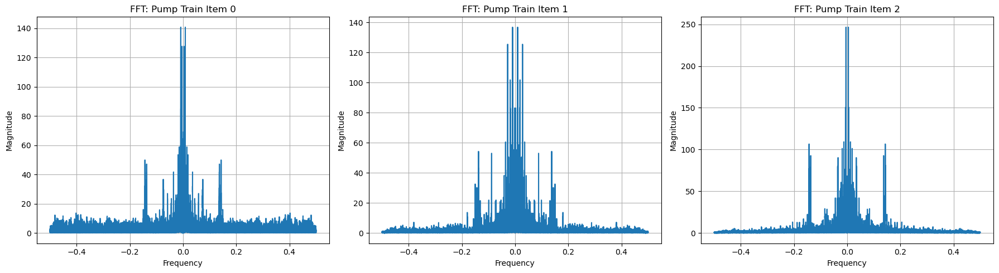

In [31]:
def get_fft(signal):
    signal_fft = np.fft.fft(signal)
    freq = np.fft.fftfreq(len(signal)) 
    return signal_fft, freq

def plot_spectrum(ax, signal, key=''):
    signal_fft, freq = get_fft(signal)
    ax.plot(freq, np.abs(signal_fft))
    ax.set_title("FFT: " + key)
    ax.set_xlabel("Frequency")
    ax.set_ylabel("Magnitude")
    ax.grid(True)

# Plotting valve data
fig1, axs1 = plt.subplots(1, 3, figsize=(18, 5)) 
for i in range(3):
    plot_spectrum(axs1[i], valve_train_data[i], f'Valve Train Item {i}')
plt.tight_layout()
plt.show()

# Plotting pump data
fig2, axs2 = plt.subplots(1, 3, figsize=(18, 5)) 
for i in range(3):
    plot_spectrum(axs2[i], pump_train_data[i], f'Pump Train Item {i}')
plt.tight_layout()
plt.show()

To get a better understanding of the time evolution in the frequency domain, we will plot the spectrogram of a sample from both the pump and valve datasets. We have used the function provided in the exercise 0.

In [32]:
SR = 16000 # SAMPLING RATE
EPSILON = 1e-6

def plot_spectrogram(y, key, sr=22050, n_fft=1600, hop_length=400, window='hann', epsilon=1e-10):
    """
    Plot the spectrogram of an audio signal using Short-Time Fourier Transform (STFT).

    This function computes and displays the spectrogram of the input audio signal
    using librosa's STFT implementation. The spectrogram is plotted on a logarithmic scale.

    Parameters:
    -----------
    y : np.ndarray
        The input audio time series as a numpy array.
    key : str
        A string identifier for the signal, used in the plot title.
    sr : int, optional
        The sampling rate of the audio signal (default is 22050 Hz).
    n_fft : int, optional
        The length of the windowed signal after padding with zeros (default is 1600).
        This parameter determines the frequency resolution of the spectrogram.
        Larger values increase frequency resolution but decrease time resolution.
    hop_length : int, optional
        Number of audio samples between adjacent STFT columns (default is 400).
        Smaller values increase time resolution at the expense of more computation.
        A common choice is n_fft // 4.
    window : str, optional
        The windowing function to use (default is 'hann').
        Other options include 'hamming', 'blackman', etc.
    epsilon : float, optional
        Small value added to the spectrogram before taking the logarithm,
        to avoid log(0) errors (default is 1e-10).

    Returns:
    --------
    None
        This function doesn't return any value. It displays the plot directly.

    Notes:
    ------
    - The spectrogram is computed using the Short-Time Fourier Transform (STFT).
    - The magnitude of the STFT is converted to a decibel scale for better visualization.
    - The color scale represents the power of the signal at each time-frequency point.
    - Brighter colors indicate higher power, while darker colors indicate lower power.

    Example:
    --------
    >>> import numpy as np
    >>> import librosa
    >>> y, sr = librosa.load('path_to_audio_file.wav')
    >>> plot_spectrogram(y, 'Example Audio', sr=sr)
    """
    # Input validation
    if not isinstance(y, np.ndarray):
        raise ValueError("Input signal must be a numpy array")
    if y.ndim != 1:
        raise ValueError("Input signal must be a 1D array")

    # Compute STFT
    spec = x = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    # librosa function for stft calculation

    # Convert to dB scale
    spec_db = 20 * np.log10(np.abs(spec) + epsilon)

    # Create the plot
    fig, ax = plt.subplots(figsize=(9, 4))
    img = librosa.display.specshow(20 * np.log10(np.abs(x) + epsilon),
                         sr=SR,
                         hop_length=hop_length,
                         x_axis="time",
                         y_axis="linear",
                         ax=ax) #librosa function for displaying the spectogram

    # Add colorbar
    fig.colorbar(img, ax=ax, format="%+2.0f dB")

    # Set title and labels
    ax.set_title(f'Spectrogram: {key}')
    ax.set_xlabel('Time')
    ax.set_ylabel('Frequency (Hz)')

    plt.tight_layout()
    plt.show()

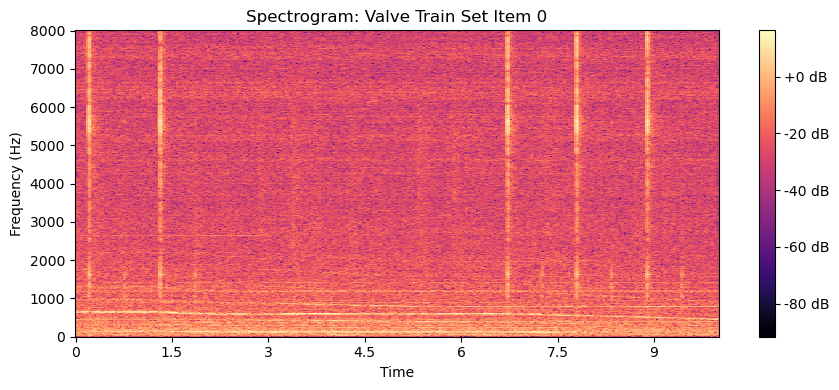

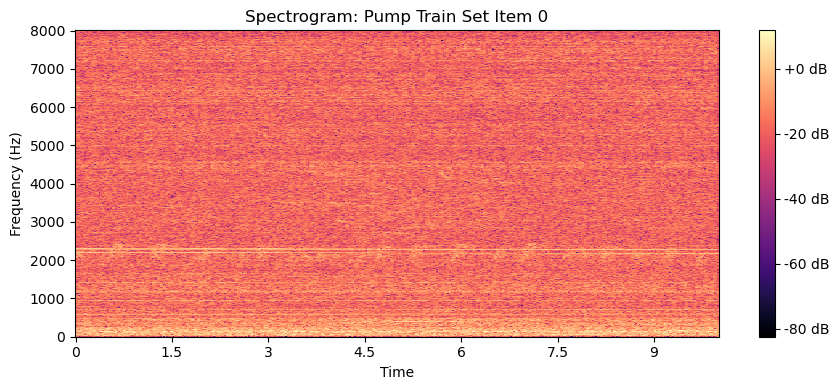

In [33]:
plot_spectrogram(valve_train_data[0], "Valve Train Set Item 0")
plot_spectrogram(pump_train_data[0], "Pump Train Set Item 0")

In order to get a better understanding of what the signal sounds like, let's plot the mel spectrograms for a sample of the valve and pump datasets. We have used the function from exercise 0.

In [34]:
def plot_mel_spectrogram(y, key, sr=22050, n_fft=1600, hop_length=1600, epsilon=1e-10):
    """
    Plot the Mel Spectrogram of an audio signal.

    This function computes and displays the Mel Spectrogram of the input audio signal
    using librosa. The spectrogram is plotted on a logarithmic scale.

    Parameters:
    -----------
    y : np.ndarray
        The input audio time series as a numpy array.
    key : str
        A string identifier for the signal, used in the plot title.
    sr : int, optional
        The sampling rate of the audio signal (default is 22050 Hz).
    n_fft : int, optional
        The length of the windowed signal after padding with zeros (default is 1600).
        The number of rows in the spectrogram will be (1 + n_fft/2).
    hop_length : int, optional
        Number of audio samples between adjacent STFT columns (default is 1600).
    epsilon : float, optional
        Small value added to the spectrogram before taking the logarithm,
        to avoid log(0) errors (default is 1e-10).

    Returns:
    --------
    None
        This function doesn't return any value. It displays the plot directly.

    Example:
    --------
    >>> import numpy as np
    >>> y = np.random.randn(22050 * 5)  # 5 seconds of random noise
    >>> plot_mel_spectrogram(y, 'Random Noise')
    """
    # Compute the Mel Spectrogram
    mel_spec = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=n_fft, hop_length=hop_length)
    
    # Convert to log scale
    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

    # Create the plot
    fig, ax = plt.subplots(figsize=(9, 4))
    img = librosa.display.specshow(mel_spec_db, sr=sr, hop_length=hop_length, 
                                   x_axis="time", y_axis="mel", ax=ax)
    
    # Add colorbar
    fig.colorbar(img, ax=ax, format="%+2.0f dB")
    
    # Set title and labels
    ax.set_title(f'Mel-Spectrogram: {key}')
    ax.set_xlabel('Time')
    ax.set_ylabel('Mel Frequency')

    plt.tight_layout()
    plt.show()

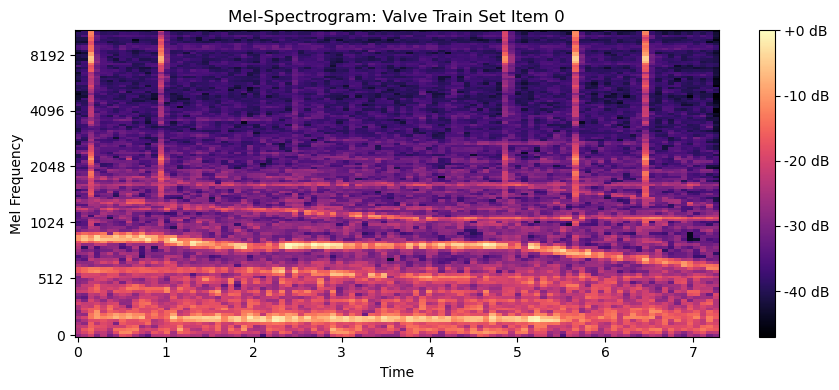

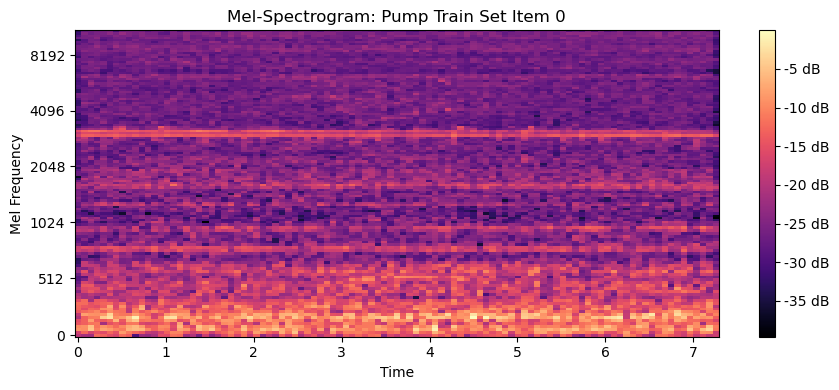

In [35]:
plot_mel_spectrogram(valve_train_data[0], "Valve Train Set Item 0")
plot_mel_spectrogram(pump_train_data[0], "Pump Train Set Item 0")

Let's visualise all of these plots together for a given sample!

In [36]:
def all_plots(signal, key='', sr=22050, n_fft=1600, hop_length=400, window='hann', epsilon=1e-10):
    # FFT calculation
    signal_fft, freq = get_fft(signal)

    # STFT calculation for spectrogram
    spectogram = librosa.stft(signal, n_fft=n_fft, hop_length=hop_length, window=window)

    # Mel Spectrogram calculation
    mel_spec = librosa.feature.melspectrogram(y=signal, sr=sr, n_fft=n_fft, hop_length=hop_length)
    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

    # Setup 2x2 plot
    fig, axs = plt.subplots(2, 2, figsize=(12, 8))

    # Raw Signal
    axs[0, 0].plot(signal)
    axs[0, 0].set_xlabel("Time")
    axs[0, 0].set_ylabel("Amplitude")
    axs[0, 0].set_title("Raw Signal")

    # Magnitude Spectrum
    axs[0, 1].plot(freq, np.abs(signal_fft))
    axs[0, 1].set_xlabel("Frequency")
    axs[0, 1].set_ylabel("Magnitude")
    axs[0, 1].set_title("Magnitude Spectrum")

    # Spectrogram
    img1 = librosa.display.specshow(20 * np.log10(np.abs(spectogram) + epsilon), sr=sr, hop_length=hop_length, x_axis="time", y_axis="linear", ax=axs[1, 0])
    axs[1, 0].set_title("Spectrogram")
    fig.colorbar(img1, ax=axs[1, 0], format="%+2.0f dB")

    # Mel Spectrogram
    img2 = librosa.display.specshow(mel_spec_db, sr=sr, hop_length=hop_length, x_axis="time", y_axis="mel", ax=axs[1, 1])
    axs[1, 1].set_title("Mel Spectrogram")
    fig.colorbar(img2, ax=axs[1, 1], format="%+2.0f dB")

    # Adjust layout and add a subtitle
    plt.suptitle(key, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

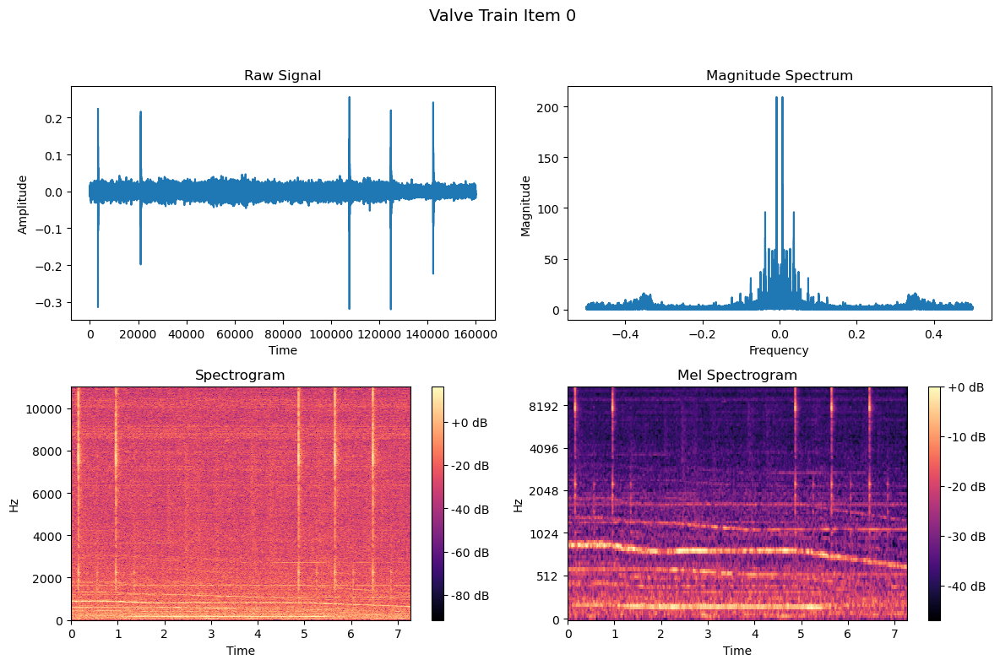

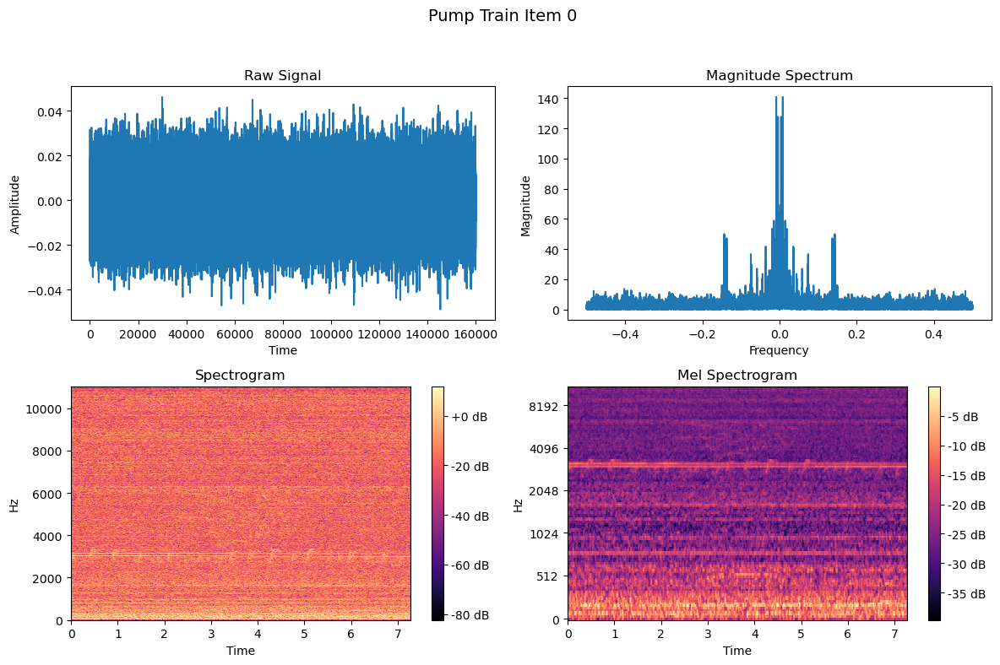

In [37]:
all_plots(valve_train_data[0], 'Valve Train Item 0')
all_plots(pump_train_data[0], 'Pump Train Item 0')

The main difference between the two seems to be that most samples from the valve have spikes to 0.1-0.2 somewhat regularly (which signals when the valve opens and closes), while the pump has a much more constant signal amplitude, confined between, roughly, ±0.05. 

This is also visible in the spectrograms, which clearly show these spikes for the valve while it is much more consistent for the pump.

# Valve

## Question 2:
### Visualize the raw signals, spectrum, and spectrograms of the test dataset for the pump/valve dataset. Are there any signals that appear abnormal to you?

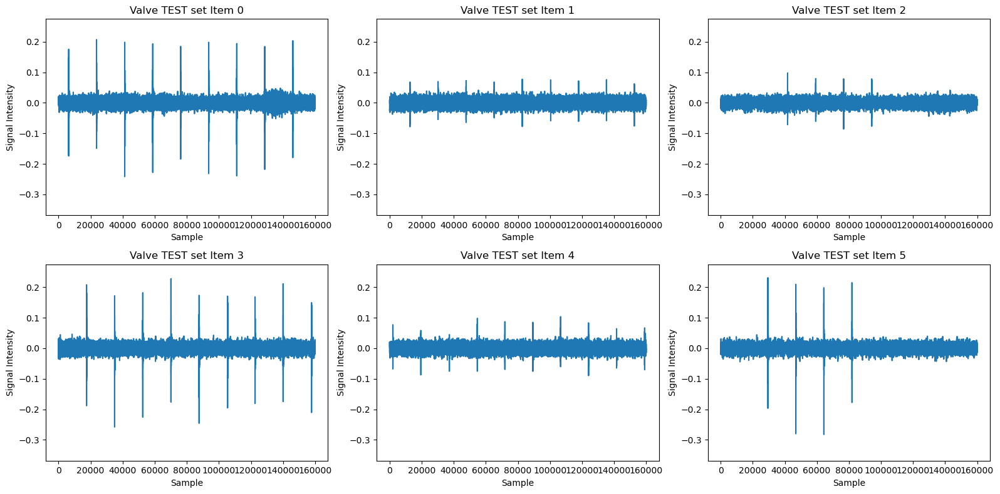

In [38]:
fig, ax = plt.subplots(2, 3, figsize=(16, 8)) 

global_min = min(data.min() for data in valve_test_data)
global_max = max(data.max() for data in valve_test_data)

for i in range(6):
    ax[i // 3, i % 3].plot(valve_test_data[i]) 
    ax[i // 3, i % 3].set_title(f"Valve TEST set Item {i}")
    ax[i // 3, i % 3].set_xlabel("Sample")
    ax[i // 3, i % 3].set_ylabel("Signal Intensity")
    ax[i // 3, i % 3].set_ylim(global_min, global_max) 

plt.tight_layout() 
plt.show()

It appears like some samples in the test dataset have smaller "spikes". Let's investigate a little further:

In [39]:
Audio(data=valve_test_data[0], rate = 22050) # Normal

In [40]:
Audio(data=valve_test_data[9], rate = 22050) # Abnormal

Clearly there is a difference between sample 0 and 9, with sample 9 in the test dataset sounding very different to the train dataset samples explored in Question 1. Let's use the below utility function to visualize the data more globally.

In [41]:
def plot_data_in_rows(data, plots_per_line):
    num_plots = len(data)
    num_rows = (num_plots + plots_per_line - 1) // plots_per_line  # Calculate the number of rows needed

    fig, axes = plt.subplots(num_rows, plots_per_line, figsize=(12, 1.5*num_rows))  
    fig.tight_layout(pad=3.0) 

    for i, ax in enumerate(axes.flat):
        if i < num_plots:
            ax.plot(data[i]) 
            ax.set_title(f'Plot {i}')
            
    plt.show()

In [42]:
# Uncomment this to visualize all test samples 
# plot_data_in_rows(valve_test_data, 2)
abnormal_idx_valve = [1, 2, 4, 7, 8, 9, 10, 19, 22, 25, 35, 45, 65, 74, 153, 160, 188, 189, 199, 205, 214] 

By looking at the test dataset we found many abnormal signals (1, 2, 4, 6, 7, 8, 9, 18, 19, 22, 25, 26, 27, 28, 29, 30, 31, 32, ...), usually characterized by spikes that stand out less (smaller peaks in the raw signal amplitude), which likely is because there is some other noise. Let's visualize what the different plots for a "normal" and (an example of) an "abnormal" sample looks like. 

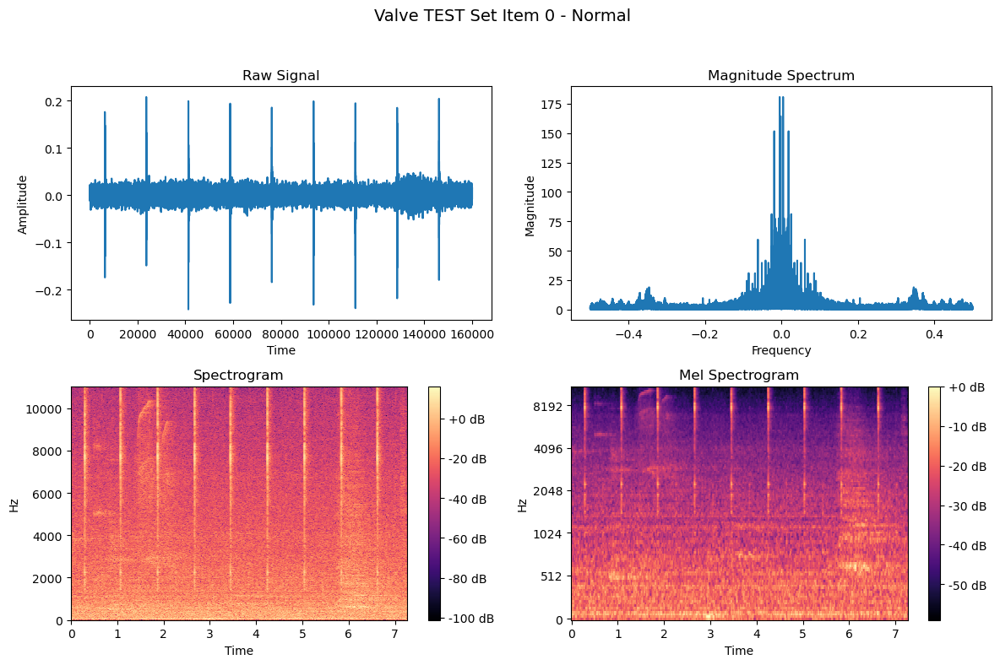

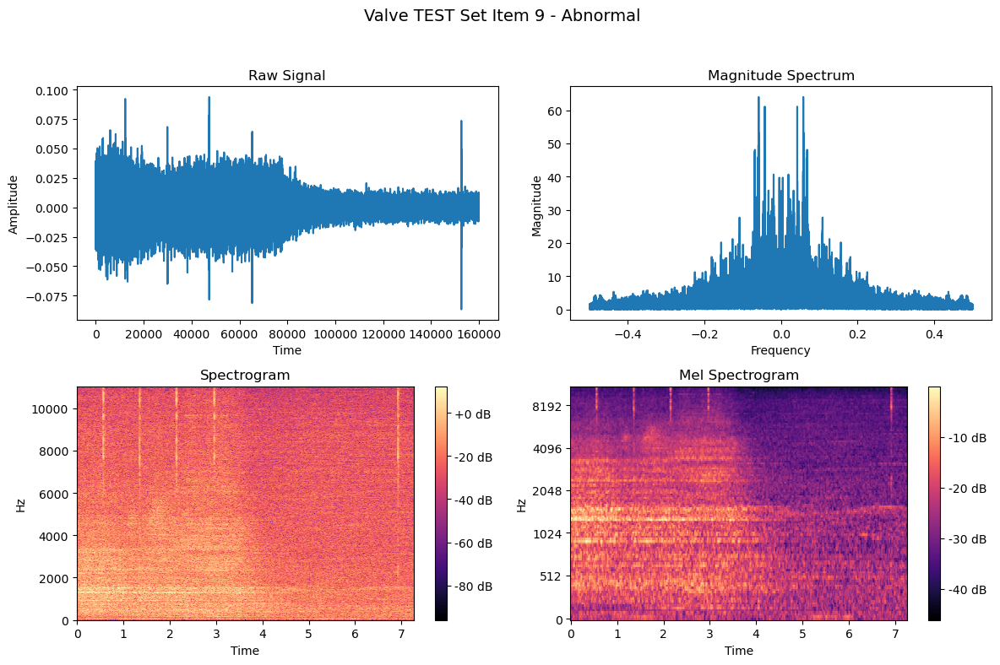

In [43]:
# Visualize weird plots 
all_plots(valve_test_data[0], "Valve TEST Set Item 0 - Normal") # normal
all_plots(valve_test_data[9], "Valve TEST Set Item 9 - Abnormal") # abnormal

## Question 3:
### Compute basic statistical features (mean, variance, skewness, and kurtosis) for both the training and test datasets of the pump and valve. Are there any abnormal signals that you can detect?

In [102]:
def get_statistics(data, train_or_test = ""):
    freq, fft = get_fft(data)

    df =   pd.DataFrame({'MaxAbs':np.amax(np.abs(data),axis=1),
                        'Mean':np.mean(data, axis=1),
                        'Variance':scist.moment(data, moment=2, axis=1, nan_policy='propagate'),
                        'Skewness':scist.skew(data, axis=1, bias=True, nan_policy='propagate'),
                        'Kurtosis':scist.kurtosis(data, axis=1, fisher=False, bias=True, nan_policy='propagate'),
                        'type': train_or_test})
    return df

In [103]:
pump_train_moments = get_statistics(valve_train_data, 'train')
valve_test_moments = get_statistics(valve_test_data, 'test')

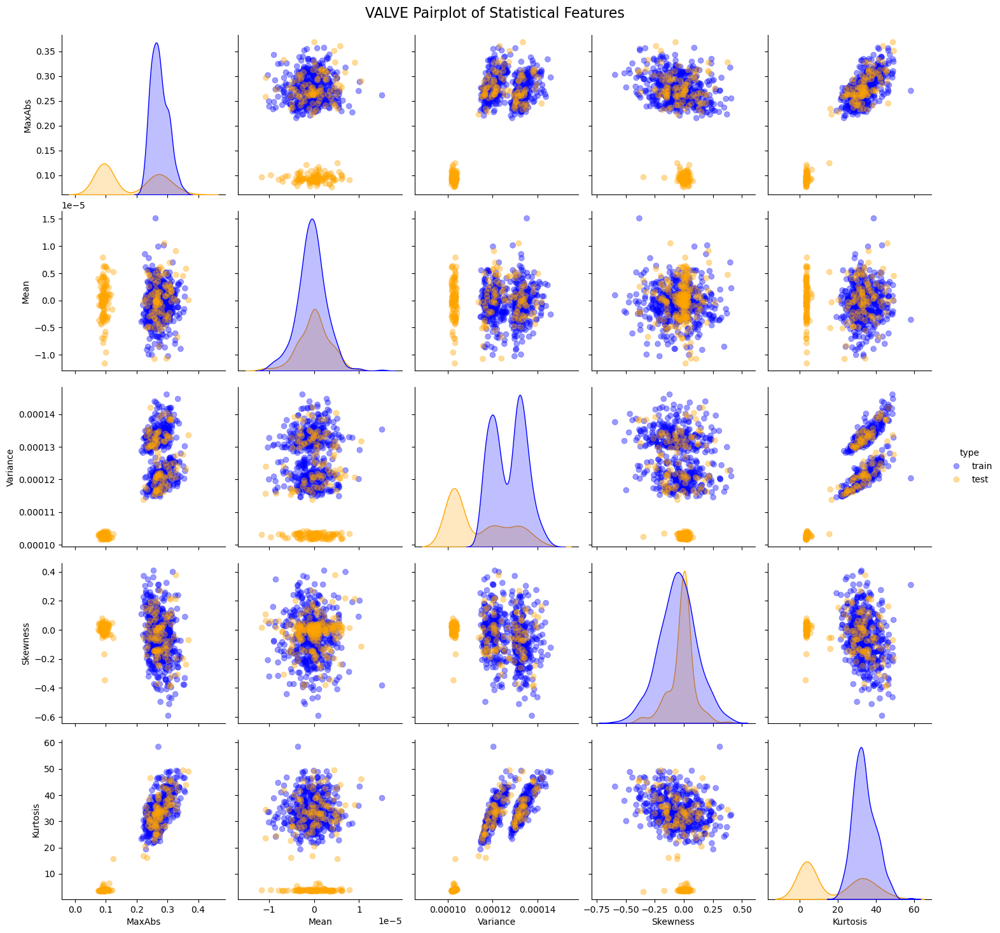

In [104]:
valve_moments = pd.concat([pump_train_moments, valve_test_moments], ignore_index=True)

sns.pairplot(
    valve_moments,
    vars=[c for c in valve_moments.columns if c != "type"],
    height=3,
    plot_kws={"alpha": 0.4, "s": 40, "edgecolor": None},
    palette = {'train': 'blue', 'test': 'orange'},
    hue='type'

)
plt.suptitle('VALVE Pairplot of Statistical Features', fontsize = 16)
plt.subplots_adjust(top=0.95)


The features Kurtosis, MaxAbs, and Variance show a clear separation between the train and test data. This likely indicates a source of anomalies. Perhaps the scaling is different, so we can use the threshold method next to find anomalies. The mean value also appears to be different (in amplitude), which is related to our earlier observation that there were many, seemingly abnormal samples in the test dataset with smaller spikes. 

To look at a specific example, we suspected earlier that valve item 9 was abnormal. Let's compare the maxAbs, mean, variance and kurtosis of the first 2 samples of the train dataset with sample 9 of the test dataset. 

In [105]:
pd.concat([pump_train_moments.iloc[:2], valve_test_moments.iloc[[9]]])

,MaxAbs,Mean,Variance,Skewness,Kurtosis,type
0,0.320007,6.338120e-07,0.000127,-0.150971,42.840961,train
1,0.300079,-1.850128e-08,0.000138,0.000811,41.740139,train
9,0.093781,1.430893e-06,0.000102,-0.021620,5.590922,test


Indeed, the MaxAbs and Kurtosis are much smaller than the healthy train dataset samples, so test item 9 seems abnormal.

## Question 4:
### Find by yourself a feature or a combination of feature that help to uncover signals with abnormal behavior. Analyze whether the selected features trigger alarms for similar behavior or if some are specific to particular anomalies.

In the previous question we have been using the features MaxAbs, Mean, Variance, Skewness, and Kurtosis. Let's now look at another set of features to try to understand if we can improve the discriminatory power of our model. Specifically, we will be looking at:
1. The root mean square (RMS), which is commonly used to measure the "energy" of a signal
2. The crest factor (which compares the RMS to the absolute value, one of our most telling features previously)
3. The zero-crossing rate (ZCR), which could be useful in determining whether a signal is more noisy than before (and generally if they have more higher frequency elements than before) by calculating how many times it crosses "zero"

In [106]:
def get_extra_features(data, train_or_test=" "):
    rms = np.sqrt(np.mean(data ** 2, axis=1))
    
    max_abs = np.amax(np.abs(data), axis=1)
    
    crest_factor = max_abs / rms
    
    # Count crossings by checking where the sign of the signal changes
    zero_crossings = np.sum(np.diff(np.sign(data), axis=1) != 0, axis=1)
    # Normalize ZCR by the length of the signal to get rate per sample
    zero_crossing_rate = zero_crossings / data.shape[1]
    
    df = pd.DataFrame({
        'RMS': rms,
        'CrestFactor': crest_factor,
        'ZeroCrossingRate': zero_crossing_rate,
        'type': train_or_test
    })
    
    return df

Let's look at how our features will do using a pairplot like before!

In [107]:
valve_train_extra_features = get_extra_features(valve_train_data, 'train')
valve_test_extra_features = get_extra_features(valve_test_data, 'test')

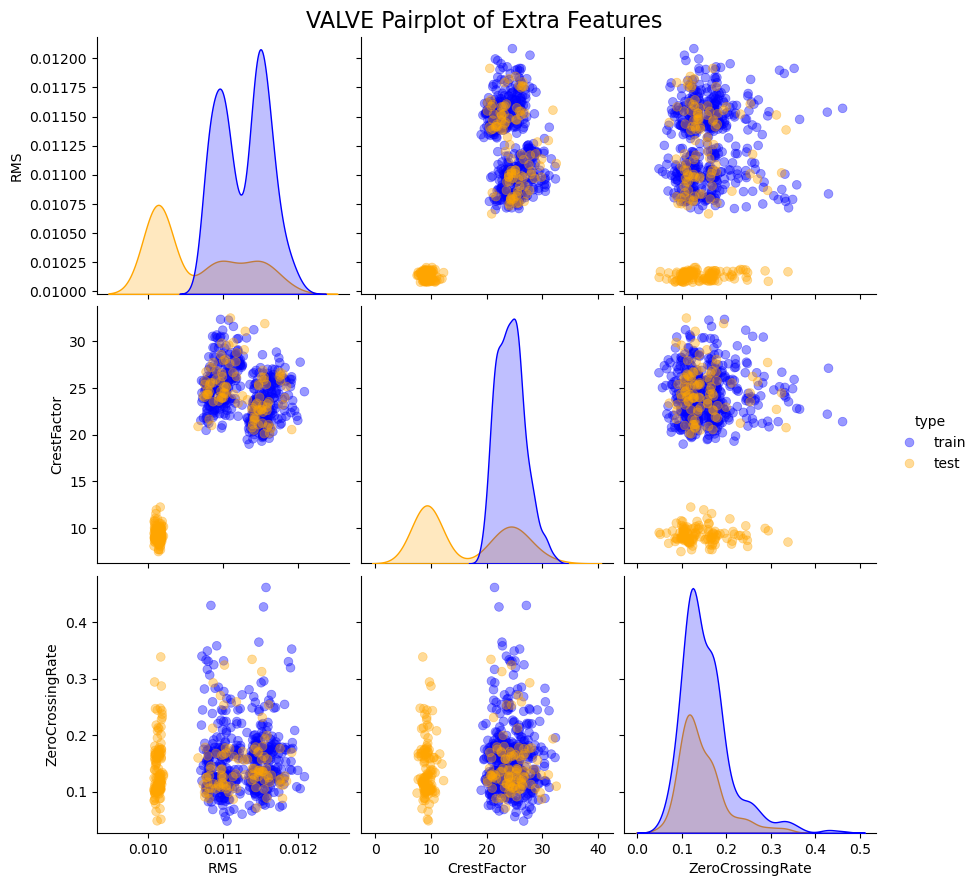

In [108]:
valve_features = pd.concat([valve_train_extra_features, valve_test_extra_features], ignore_index=True)

sns.pairplot(
    valve_features,
    vars=[c for c in valve_features.columns if c != "type"],
    height=3,
    plot_kws={"alpha": 0.4, "s": 40, "edgecolor": None},
    palette = {'train': 'blue', 'test': 'orange'},
    hue='type'

)
plt.suptitle('VALVE Pairplot of Extra Features', fontsize = 16)
plt.subplots_adjust(top=0.95)


This is quite promising! Indeed we see clear peaks in the histograms, and the features seem someone discriminatory among each other as well (since we can see the formation of distinct "blobs"). let's now create a simple classifier using thresholds, like used in the toy example. 

In [109]:
# concatenate the initial statistical measures with the new extra features - train
pump_train_moments.reset_index(drop=True, inplace=True)
valve_train_extra_features.reset_index(drop=True, inplace=True)
pump_train_moments = pump_train_moments.drop(columns=["type"])

valve_train_features = pd.concat([pump_train_moments, valve_train_extra_features], axis=1)


# concatenate the initial statistical measures with the new extra features - test
valve_test_moments.reset_index(drop=True, inplace=True)
valve_test_extra_features.reset_index(drop=True, inplace=True)
valve_test_moments = valve_test_moments.drop(columns=["type"])


valve_test_features = pd.concat([valve_test_moments, valve_test_extra_features], axis=1)

In [110]:
valve_test_features

,MaxAbs,Mean,Variance,Skewness,Kurtosis,RMS,CrestFactor,ZeroCrossingRate,type
0,0.241638,4.705239e-06,0.000132,-0.067234,29.975693,0.011469,21.068415,0.127013,test
1,0.078186,-3.701019e-06,0.000103,0.045319,3.525067,0.010165,7.691977,0.121838,test
2,0.097900,-6.372833e-06,0.000102,-0.046448,3.486319,0.010100,9.693460,0.078600,test
3,0.258057,-3.294182e-06,0.000130,-0.066495,29.162884,0.011383,22.670536,0.120137,test
4,0.103699,-1.508904e-06,0.000104,-0.001222,3.988425,0.010206,10.160786,0.130931,test
...,...,...,...,...,...,...,...,...,...
214,0.124542,5.223083e-06,0.000103,-0.056311,15.612670,0.010162,12.256220,0.119913,test
215,0.086914,-4.156113e-07,0.000102,0.030589,3.636809,0.010118,8.589770,0.124031,test
216,0.095276,1.054573e-06,0.000103,-0.023532,3.686224,0.010132,9.403871,0.171387,test
217,0.092072,1.367187e-06,0.000104,0.017418,3.738149,0.010177,9.046652,0.175619,test


In [206]:
def plot_thresholds(train_moments, test_moments):
    quantiles = [0.2, 99.8]
    features = ["MaxAbs", "Mean", "Variance", "Skewness", "Kurtosis", "RMS", "CrestFactor", "ZeroCrossingRate"]
    
    # Calculate the percentile limits for each feature using the training data
    limits = {}
    for feature in features:
        limits[feature] = np.percentile(train_moments.loc[:, feature], quantiles)
    
    # Prepare the percentage scale for plotting
    train_set_size = train_moments.shape[0]
    test_set_size = test_moments.shape[0]
    train_percentage = np.linspace(0, 100, train_set_size)  # From 0% to 100%
    test_percentage = np.linspace(0, 100, test_set_size)
    
    # Determine the layout of subplots
    num_features = len(features)
    num_cols = 2
    num_rows = (num_features + 1) // num_cols  # Ensure enough rows for all features
    
    # Create the figure and subplots
    plt.figure(figsize=(15, num_rows * 4))
    plt.clf()
    plt.suptitle(
        "Feature Analysis: Training vs. Test Data",
        fontsize=20,
    )
    
    # Loop over each feature to create subplots
    for idx, feature in enumerate(features):
        plt.subplot(num_rows, num_cols, idx + 1)
        
        # Plot the sorted training feature values against the percentage scale
        plt.plot(
            np.sort(train_moments.loc[:, feature]), train_percentage, 
            marker=".", linestyle="None", label="Train", color="blue"
        )
        
        # Plot the sorted test feature values against the percentage scale
        plt.plot(
            np.sort(test_moments.loc[:, feature]), test_percentage, 
            marker=".", linestyle="None", label="Test", color="orange"
        )
        
        # Plot the percentile limits as vertical lines
        limit = limits[feature]
        plt.axvline(x=limit[0], color="k", linestyle="--", label="Threshold")
        plt.axvline(x=limit[1], color="k", linestyle="--")
        
        # Set labels and titles
        plt.xlabel(f"{feature}")
        plt.ylabel("Percentile")
        plt.title(f"{feature} Distribution")
        plt.legend()
        
    
    
    # Adjust layout to prevent overlap
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


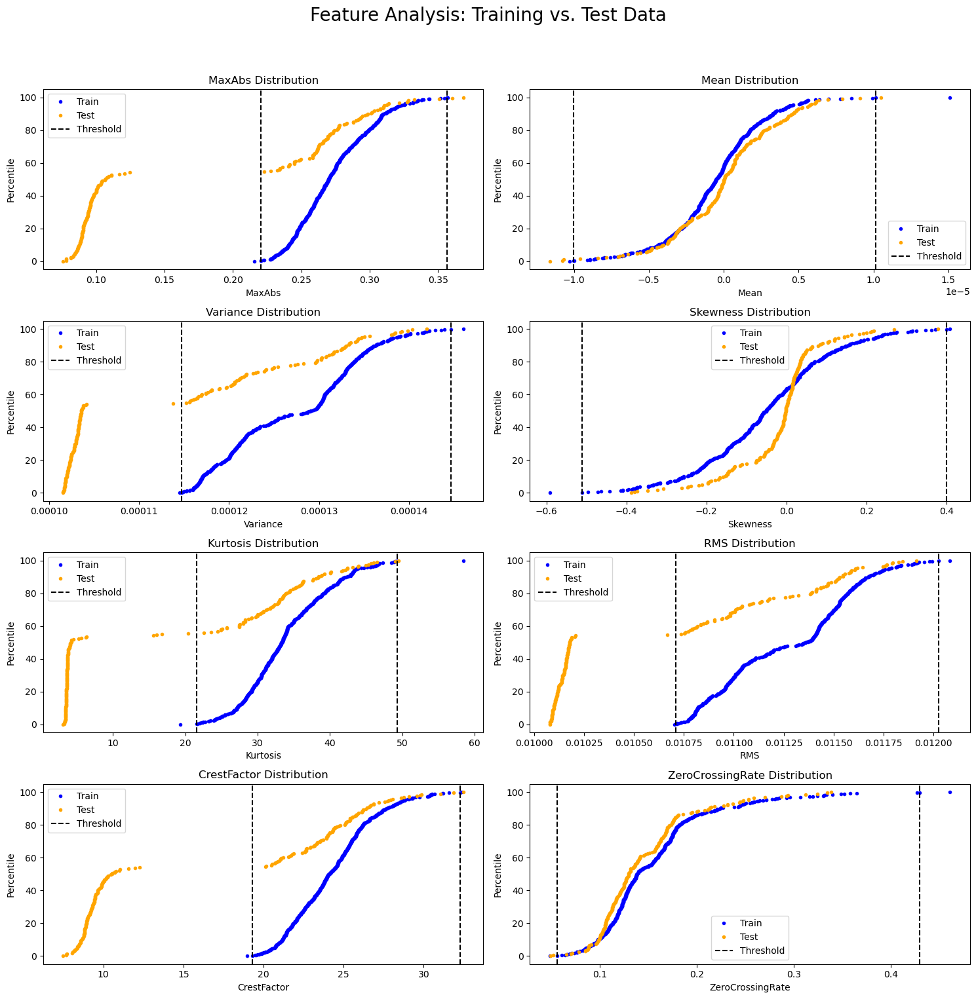

In [207]:
plot_thresholds(valve_train_features, valve_test_features)

So it seems that MaxAbs, Variance, Kurtosis, RMS, and Crestfactor are able to detect anomalies, while the other features do not seem informative. Let's remove the ZCR, Skewness, and Mean from our feature set, and move on to understand the overlap in those anomalies!

_Disclaimer: we used ChatGPT to separate the code given in the toy dataset into more clean functions, in order to understand what it was doing better. However the code has since been adapted and reviewed._

First, let's create several utility functions, with the end goal of analysing if the anomalies are similar or not.

In [208]:
# Compute the percentile limits for each feature using specified quantiles
def compute_limits(data, features, quantiles):
    limits = {}
    for feature in features:
        limits[feature] = np.percentile(data[feature], quantiles)
    return limits

We will find anomalies based on the defined thresholds (0.5% for train, 0.2% for test)

In [209]:
# Identify anomalies in the dataset based on provided limits for each feature
def find_anomalies(data, limits, features):
    anomalies = {}
    for feature in features:
        lower_limit, upper_limit = limits[feature]
        abn_indices = data.index[
            (data[feature] < lower_limit) | (data[feature] > upper_limit)
        ].tolist()
        anomalies[feature] = abn_indices
    return anomalies

In [210]:
# Count how many times each sample is flagged as anomalous across all features
def count_anomalies(anomalies, data_size):
    anomalies_count = np.zeros(data_size, dtype=int)
    for indices in anomalies.values():
        anomalies_count[indices] += 1
    return anomalies_count

In [211]:
# Print the number of anomalies found for each feature in the dataset
def print_anomaly_counts(anomalies, dataset_name):
    print(f"\n{dataset_name.upper()} DATASET")
    for feature, indices in anomalies.items():
        print(f"{feature}: {len(indices)} anomalies found.")

In [212]:
# Print the number of samples found anomalous by at least N selection methods
def print_samples_anomalous_by_at_least_N(anomalies_count, N=5):
    for i in range(1, N + 1):
        num_samples = np.sum(anomalies_count >= i)
        print(
            f"{num_samples} samples are found as anomalous "
            f"by at least {i} selection methods."
        )

In [213]:
# # Analyse anomalies in both training and test datasets using specified features
# def analyse_anomalies(train_data, test_data, features):
#     train_quantiles = [0.5, 99.5]
#     test_quantiles = [0.2, 99.8]
    
#     train_limits = compute_limits(train_data, features, train_quantiles)
#     test_limits = compute_limits(train_data, features, test_quantiles)  # Use train data for limits
    
#     train_anomalies = find_anomalies(train_data, train_limits, features)
#     print_anomaly_counts(train_anomalies, "Training")
    
#     train_set_size = len(train_data)
#     anomalies_count_train = count_anomalies(train_anomalies, train_set_size)
#     print_samples_anomalous_by_at_least_N(anomalies_count_train, N=len(features))
    
#     test_anomalies = find_anomalies(test_data, test_limits, features)
#     print_anomaly_counts(test_anomalies, "Test")
    
#     test_set_size = len(test_data)
#     anomalies_count_test = count_anomalies(test_anomalies, test_set_size)
#     print_samples_anomalous_by_at_least_N(anomalies_count_test, N=len(features))

In [214]:
 def analyse_anomalies(data, features, dataset_type, train_limits=None):
    # Analyze anomalies in the dataset based on whether it's training or test data
    if dataset_type == "Train":
        quantiles = [0.5, 99.5]
        # Compute limits from training data
        limits = compute_limits(data, features, quantiles)
        anomalies = find_anomalies(data, limits, features)
        print_anomaly_counts(anomalies, dataset_type)
        data_set_size = len(data)
        anomalies_count = count_anomalies(anomalies, data_set_size)
        print_samples_anomalous_by_at_least_N(anomalies_count, N=len(features))
        return limits  # Return limits for use with test data
    elif dataset_type == "Test":
        if train_limits is None:
            raise ValueError("For Test data, train_limits must be provided.")
        quantiles = [0.2, 99.8]  # These quantiles are not used in this case
        # Use limits from training data
        anomalies = find_anomalies(data, train_limits, features)
        print_anomaly_counts(anomalies, dataset_type)
        data_set_size = len(data)
        anomalies_count = count_anomalies(anomalies, data_set_size)
        print_samples_anomalous_by_at_least_N(anomalies_count, N=len(features))
    else:
        raise ValueError("dataset_type must be 'Train' or 'Test'")

In [215]:
# List of features to analyze
features = ["MaxAbs", "Variance", "Kurtosis", "RMS", "CrestFactor"]

# Analyze anomalies
valve_train_limits = analyse_anomalies(valve_train_features, features, "Train")
analyse_anomalies(valve_test_features, features, "Test", train_limits=valve_train_limits)




TRAIN DATASET
MaxAbs: 6 anomalies found.
Variance: 6 anomalies found.
Kurtosis: 6 anomalies found.
RMS: 6 anomalies found.
CrestFactor: 6 anomalies found.
18 samples are found as anomalous by at least 1 selection methods.
10 samples are found as anomalous by at least 2 selection methods.
2 samples are found as anomalous by at least 3 selection methods.
0 samples are found as anomalous by at least 4 selection methods.
0 samples are found as anomalous by at least 5 selection methods.

TEST DATASET
MaxAbs: 121 anomalies found.
Variance: 120 anomalies found.
Kurtosis: 123 anomalies found.
RMS: 120 anomalies found.
CrestFactor: 121 anomalies found.
125 samples are found as anomalous by at least 1 selection methods.
122 samples are found as anomalous by at least 2 selection methods.
120 samples are found as anomalous by at least 3 selection methods.
119 samples are found as anomalous by at least 4 selection methods.
119 samples are found as anomalous by at least 5 selection methods.


These results pretty clearly show that (test) samples that are anomalous in one metric are usually anomalous in another! Around 119 samples are anomalous according to all 5 features which we have selected, which gives strength to each of them (they give redundancy, although there might be concerns of them measuring the same things)

This means that theoretically using only one of these features could be enough to identify the vast majority of anomalies, although as previously mentioned having redundance is useful and there are also a small number of samples which were only caught by one metric or another, which suggests that in practice we would like to use as many features as possible. 

If we wanted to reduce the number of features, using just kurtosis could be the wisest choice, as it flags the most anomalies and thus may avoid false negatives the most (which is what we want to avoid).

In [254]:
def plot_venn_diagram(anomalies, dataset_name, feature_set):

    if feature_set == "valve_1":
        features = ["Kurtosis", "MaxAbs", "CrestFactor"]
    elif feature_set == "valve_2":
        features = ["RMS", "CrestFactor", "Variance"]
    elif feature_set == "valve_3":
        features = ["RMS", "Kurtosis", "Variance"]
    elif feature_set == "pump_1":
        features = ["RMS", "Kurtosis", "Variance"]
    elif feature_set == "pump_2":
        features = ["Kurtosis", "Variance", "ZeroCrossingRate"]
    elif feature_set == "pump_3":
        features = ["CrestFactor", "MaxAbs", "ZeroCrossingRate"]
    elif feature_set == "pump_4":
        features = ["RMS", "CrestFactor", "Variance"]
    elif feature_set == "pump_5":
        features = ["RMS", "CrestFactor", "Kurtosis"]
    
    # Ensure the selected features are in the anomalies dictionary
    for feature in features:
        if feature not in anomalies:
            raise ValueError(f"Feature '{feature}' not found in anomalies.")
    
    # Create sets of indices for anomalies in each feature
    set1 = set(anomalies[features[0]])  # Anomalies in 'Kurtosis'
    set2 = set(anomalies[features[1]])  # Anomalies in 'MaxAbs'
    set3 = set(anomalies[features[2]])  # Anomalies in 'CrestFactor'
    
    # Create the Venn diagram
    plt.figure(figsize=(8, 6))
    venn = venn3(
        [set1, set2, set3],
        set_labels=(features[0], features[1], features[2]),
        set_colors=('red', 'green', 'blue'),
        alpha=0.5
    )
    
    # Customize subset labels to show counts
    for text in venn.set_labels:
        text.set_fontsize(14)
    for text in venn.subset_labels:
        if text:
            text.set_fontsize(12)
    
    plt.title(f'Anomaly Overlap Among Features ({dataset_name} Data)', fontsize=16)
    plt.show()

def analyse_anomalies_with_venn(train_data, test_data, features_to_analyze, feature_set):
    quantiles = [0.5, 99.5]
    limits = compute_limits(train_data, features_to_analyze, quantiles)
    test_anomalies = find_anomalies(test_data, limits, features_to_analyze)
    plot_venn_diagram(test_anomalies, "Test", feature_set)

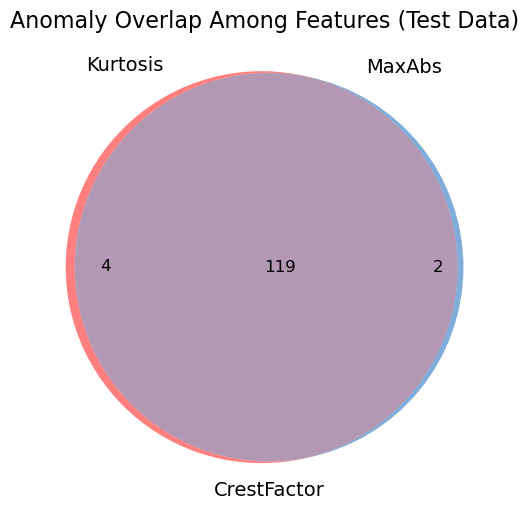

In [240]:
features_to_analyze = ["MaxAbs", "Variance", "Kurtosis", "RMS", "CrestFactor"]

analyse_anomalies_with_venn(valve_train_features, valve_test_features, features_to_analyze, feature_set="valve_1")

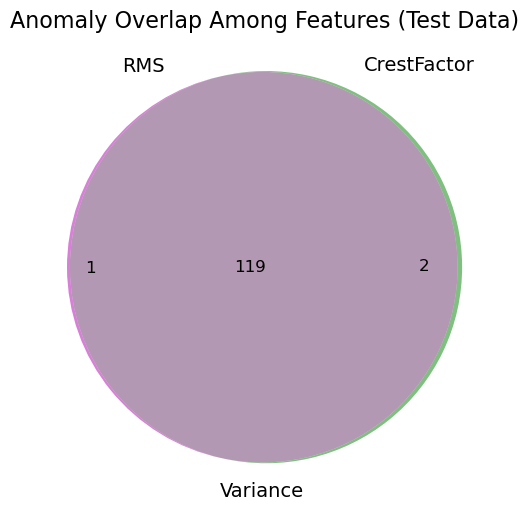

In [241]:
features_to_analyze = ["MaxAbs", "Variance", "Kurtosis", "RMS", "CrestFactor"]

analyse_anomalies_with_venn(valve_train_features, valve_test_features, features_to_analyze, feature_set="valve_2")

By playing around with different feature sets (it is unfortunately quite difficult to make a venn diagram with 5 circles), we notice that around 119-120 samples are consistently overlapping! This strengthens our claim from the anomaly analysis that most of the anomalies show up using most of our features. We can thus pretty confidently classify at least 119 samples as anomalies for the valve and there are around 6 which should be looked at more closely to understand if they are anomalous. 

# Pump

## Question 2
### Visualize the raw signals, spectrum, and spectrograms of the test dataset for the pump/valve dataset. Are there any signals that appear abnormal to you?

Let's kick off the same way, visualizing some raw signals.

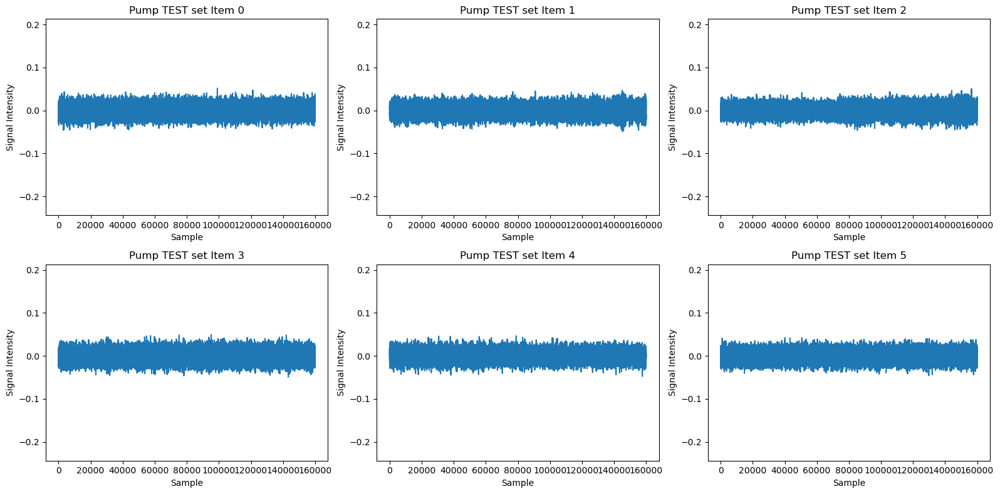

In [217]:
fig, ax = plt.subplots(2, 3, figsize=(16, 8)) 

global_min = min(data.min() for data in pump_test_data)
global_max = max(data.max() for data in pump_test_data)

for i in range(6):
    ax[i // 3, i % 3].plot(pump_test_data[i]) 
    ax[i // 3, i % 3].set_title(f"Pump TEST set Item {i}")
    ax[i // 3, i % 3].set_xlabel("Sample")
    ax[i // 3, i % 3].set_ylabel("Signal Intensity")
    ax[i // 3, i % 3].set_ylim(global_min, global_max) 

plt.tight_layout() 
plt.show()

Let's use the same utility function as defined in the Question 2 for the valve, to find abnormal-looking samples. (plot_data_in_rows is commented out to avoid showing the 200+ plots)

In [218]:
# plot_data_in_rows(pump_test_data, 2)
abnormal_idx_pump = [12, 34, 48, 57, 60, 80, 87, 88, 96, 123, 133, 168, 175, 195] # found visually using the plot_data_in_rows function

While they were harder to spot visually (or simply, less common), we still found many anomalies in the test dataset (12, 34, 48, 57, 60, 80, ....). Let's listen to them:

In [219]:
Audio(data=pump_test_data[0], rate = 22050) # Normal

In [220]:
Audio(data=pump_test_data[12], rate = 22050) # Abnormal

In [257]:
Audio(data=pump_test_data[80], rate = 22050) # (Visually) Abnormal

One thing we can notice is that it is not clear whether or not the "abnormal" noise is coming from the pump or is something in the distance. Definitely something to keep in mind for our analysis later on... (for example it's pretty clear that 12 is an anomaly but not so clear for 34, 80, 87...)

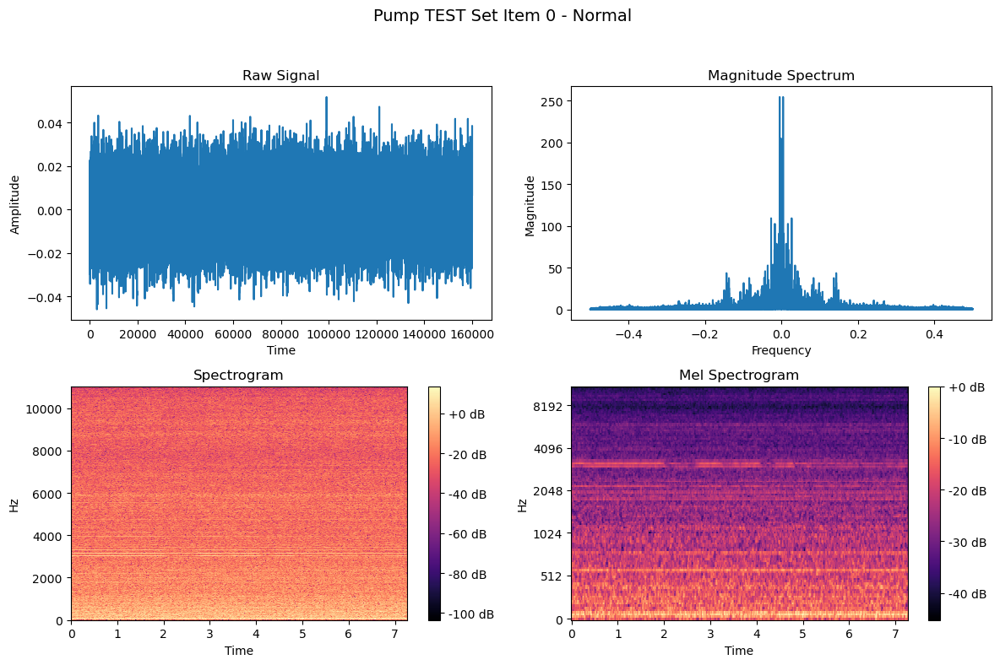

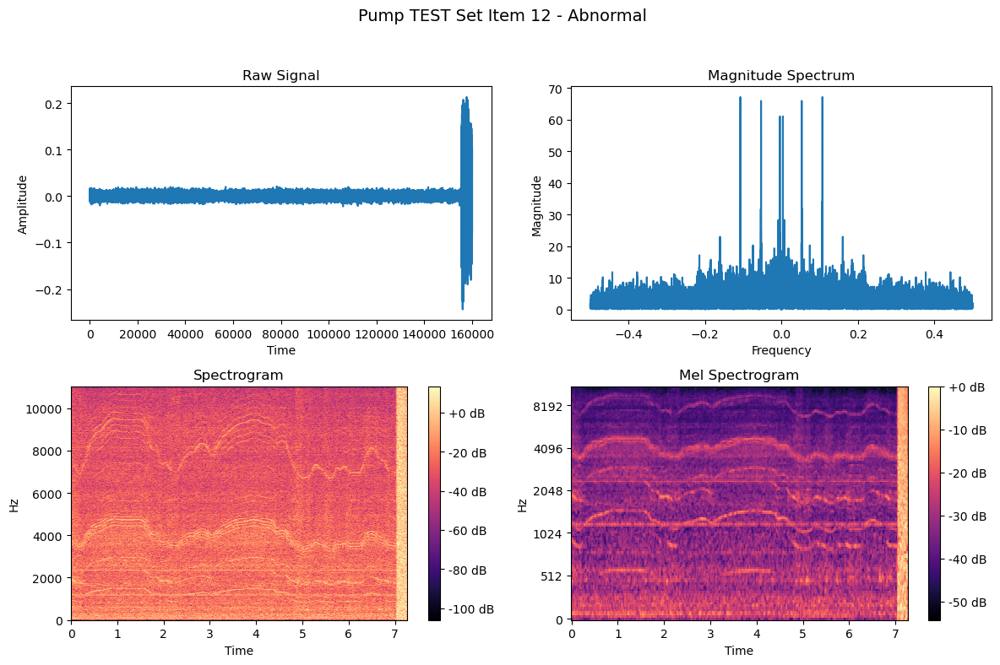

In [222]:
all_plots(pump_test_data[0], "Pump TEST Set Item 0 - Normal") # normal
all_plots(pump_test_data[12], "Pump TEST Set Item 12 - Abnormal") # abnormal

We can very clearly see that the test set item 12 is anomalous, which confirms our intuition when we listened to the audio or looked at the raw signal. 

## Question 3
### Compute basic statistical features (mean, variance, skewness, and kurtosis) for both the training and test datasets of the pump and valve. Are there any abnormal signals that you can detect?

In [223]:
pump_train_moments = get_statistics(pump_train_data, 'train')
pump_test_moments = get_statistics(pump_test_data, 'test')

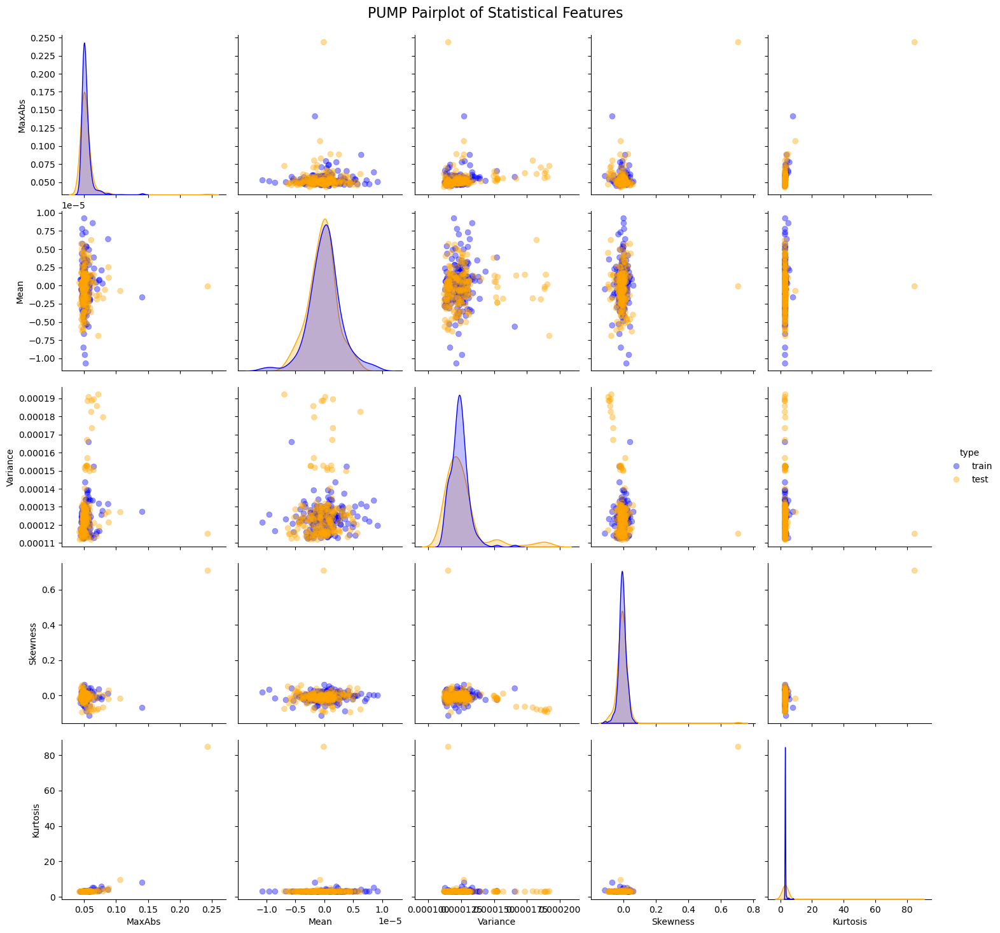

In [224]:
pump_moments = pd.concat([pump_train_moments, pump_test_moments], ignore_index=True)

sns.pairplot(
    pump_moments,
    vars=[c for c in pump_moments.columns if c != "type"],
    height=3,
    plot_kws={"alpha": 0.4, "s": 40, "edgecolor": None},
    palette = {'train': 'blue', 'test': 'orange'},
    hue='type'
)
plt.suptitle('PUMP Pairplot of Statistical Features', fontsize = 16)
plt.subplots_adjust(top=0.95)

From the above, we can more or less confirm our theory that it is less obvious discerning anomalies for the pump, than the valve. The selected features are not so effective at discerning them. Nonetheless, the Variance, and Kurtosis do not overlap perfectly, which suggest there may be some discerning power with these features (although this is definitely less clear than for the valve). 

Earlier, we suspected valve item 12 was abnormal. Let's compare the statistics of the 12th test sample to the first 2 training samples.

In [225]:
pd.concat([pump_train_moments.iloc[:2], pump_test_moments.iloc[[12]]])

,MaxAbs,Mean,Variance,Skewness,Kurtosis,type
0,0.048767,1.686096e-07,0.000117,-0.021724,2.991884,train
1,0.065735,2.346611e-06,0.000113,0.022433,4.980919,train
12,0.243713,-1.054764e-07,0.000115,0.707751,84.745613,test


Here we can in fact see that sample 12 in the test dataset is meaningfully different to the healthy samples in the train dataset. MaxAbs is larger, Skewness is also much larger (although seeing the distribution of skewness in the test dataset, sample 12 might be one of few outliers), and the kurtosis is also meaningfully different in the sample. 

## Question 4
### Find by yourself a feature or a combination of feature that help to uncover signals with abnormal behavior. Analyze whether the selected features trigger alarms for similar behavior or if some are specific to particular anomalies.

In the previous question we have been using the features MaxAbs, Mean, Variance, Skewness, and Kurtosis. Let's now look at another set of features to try to understand if we can improve the discriminatory power of our model. As for the valve, we will be looking at:
1. The root mean square (RMS), which is commonly used to measure the "energy" of a signal
2. The crest factor (which hopefully can identify if there are unusual "peaks", although as mentioned in question 2 we will have to be careful before claiming a defect, since we don't know if the "spike" is from some background noise)
3. The zero-crossing rate (ZCR), which could be useful in determining whether a signal is more noisy than before (and generally if they have more higher frequency elements than before) by calculating how many times it crosses "zero".

In [226]:
pump_train_extra_features = get_extra_features(pump_train_data, 'train')
pump_test_extra_features = get_extra_features(pump_test_data, 'test')

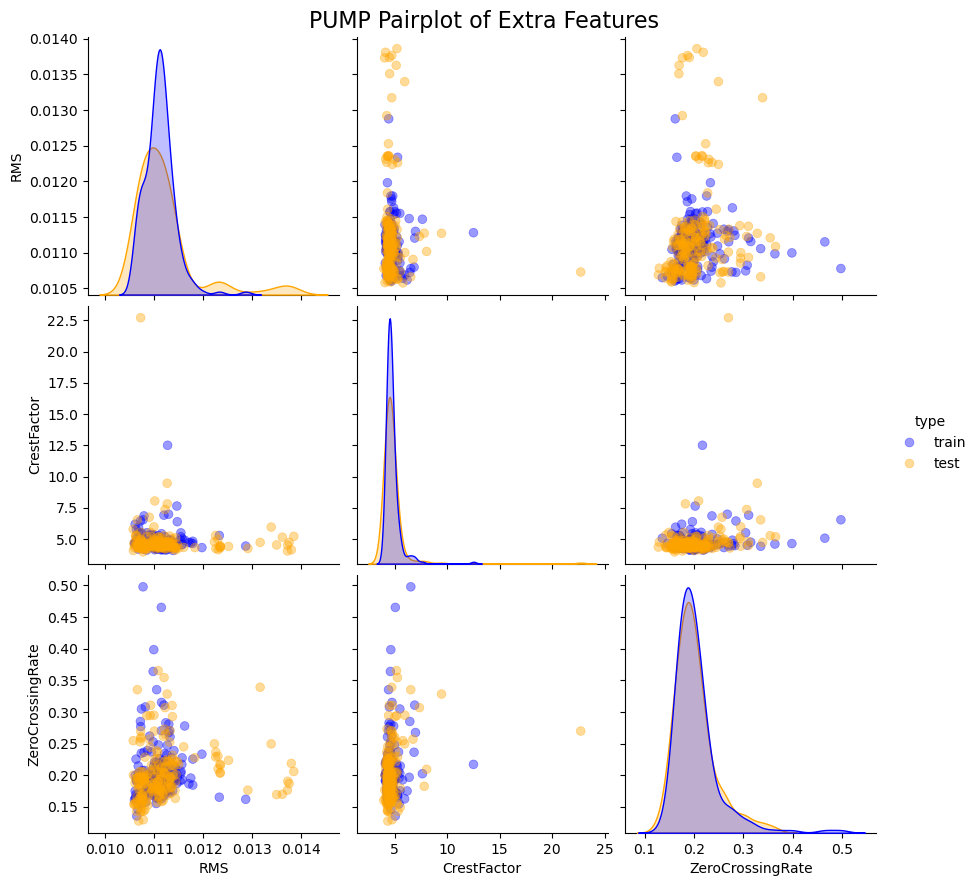

In [227]:
pump_features = pd.concat([pump_train_extra_features, pump_test_extra_features], ignore_index=True)

sns.pairplot(
    pump_features,
    vars=[c for c in valve_features.columns if c != "type"],
    height=3,
    plot_kws={"alpha": 0.4, "s": 40, "edgecolor": None},
    palette = {'train': 'blue', 'test': 'orange'},
    hue='type'

)
plt.suptitle('PUMP Pairplot of Extra Features', fontsize = 16)
plt.subplots_adjust(top=0.95)


It seems like the RMS might be somewhat promising, although the others seem to not extract so much information. Let's investigate this further by trying to classify anomalies in a similar fashion to how we did with the valve.

In [228]:
# concatenate the initial statistical measures with the new extra features - train
pump_train_moments.reset_index(drop=True, inplace=True)
pump_train_extra_features.reset_index(drop=True, inplace=True)
pump_train_moments = pump_train_moments.drop(columns=["type"])

pump_train_features = pd.concat([pump_train_moments, pump_train_extra_features], axis=1)


# concatenate the initial statistical measures with the new extra features - test
pump_test_moments.reset_index(drop=True, inplace=True)
pump_test_extra_features.reset_index(drop=True, inplace=True)
pump_test_moments = pump_test_moments.drop(columns=["type"])


pump_test_features = pd.concat([pump_test_moments, pump_test_extra_features], axis=1)

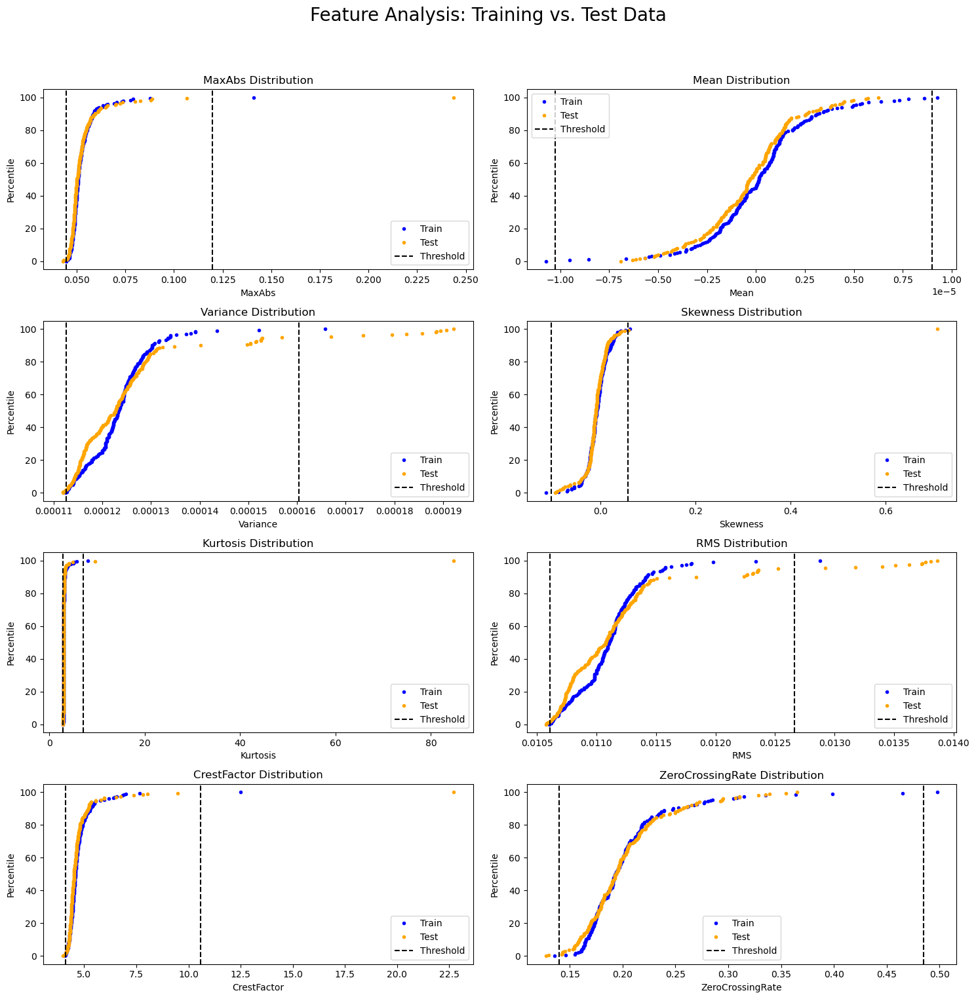

In [229]:
plot_thresholds(pump_train_features, pump_test_features)

As expected, it seems like only the variance and RMS hold any sort of true discriminatory power. Let's confirm this using the anomaly analysis function we defined earlier. 

In [230]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [233]:
# List of features to analyze
features = ["MaxAbs", "Mean", "Variance", "Skewness", "Kurtosis", "RMS", "CrestFactor", "ZeroCrossingRate"]

# Analyze anomalies
pump_train_limits = analyse_anomalies(pump_train_features, features, "Train")


TRAIN DATASET
MaxAbs: 2 anomalies found.
Mean: 2 anomalies found.
Variance: 2 anomalies found.
Skewness: 2 anomalies found.
Kurtosis: 2 anomalies found.
RMS: 2 anomalies found.
CrestFactor: 2 anomalies found.
ZeroCrossingRate: 2 anomalies found.
12 samples are found as anomalous by at least 1 selection methods.
3 samples are found as anomalous by at least 2 selection methods.
1 samples are found as anomalous by at least 3 selection methods.
0 samples are found as anomalous by at least 4 selection methods.
0 samples are found as anomalous by at least 5 selection methods.
0 samples are found as anomalous by at least 6 selection methods.
0 samples are found as anomalous by at least 7 selection methods.
0 samples are found as anomalous by at least 8 selection methods.


In [234]:
analyse_anomalies(pump_test_features, features, "Test", train_limits=pump_train_limits)


TEST DATASET
MaxAbs: 6 anomalies found.
Mean: 0 anomalies found.
Variance: 20 anomalies found.
Skewness: 5 anomalies found.
Kurtosis: 12 anomalies found.
RMS: 20 anomalies found.
CrestFactor: 7 anomalies found.
ZeroCrossingRate: 7 anomalies found.
36 samples are found as anomalous by at least 1 selection methods.
27 samples are found as anomalous by at least 2 selection methods.
9 samples are found as anomalous by at least 3 selection methods.
5 samples are found as anomalous by at least 4 selection methods.
0 samples are found as anomalous by at least 5 selection methods.
0 samples are found as anomalous by at least 6 selection methods.
0 samples are found as anomalous by at least 7 selection methods.
0 samples are found as anomalous by at least 8 selection methods.


It seems like all methods aside from the Mean have found some anomalies. However, only 9 samples have been found as anomalous by at least 3 methods, which suggests that there is not a perfect overlap. Let's try to plot the Venn Diagram to understand this further. 

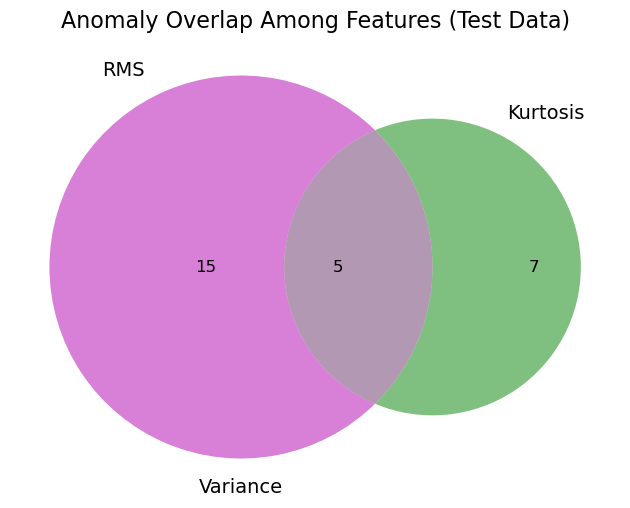

In [249]:
analyse_anomalies_with_venn(pump_train_features, pump_test_features, features, feature_set="pump_1")

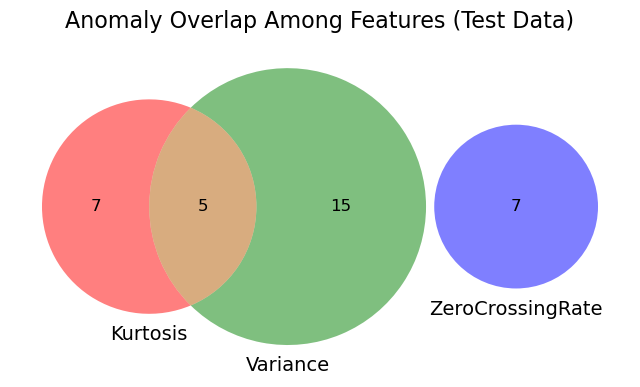

In [255]:
analyse_anomalies_with_venn(pump_train_features, pump_test_features, features, feature_set="pump_2")

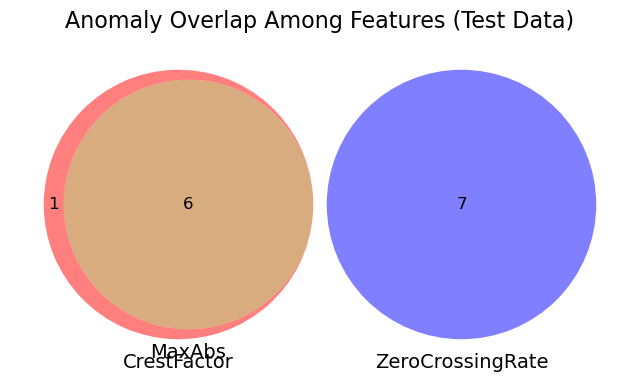

In [251]:
analyse_anomalies_with_venn(pump_train_features, pump_test_features, features, feature_set="pump_3")

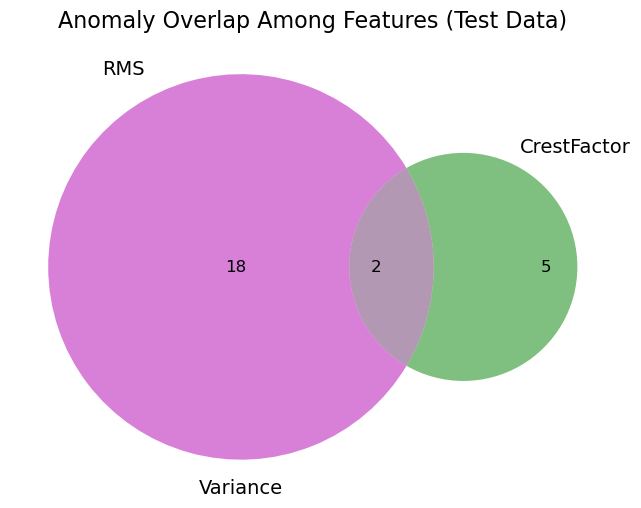

In [252]:
analyse_anomalies_with_venn(pump_train_features, pump_test_features, features, feature_set="pump_4")

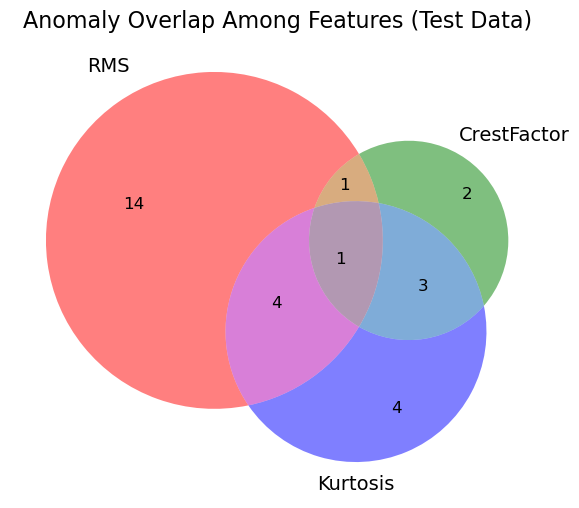

In [253]:
analyse_anomalies_with_venn(pump_train_features, pump_test_features, features, feature_set="pump_5")

These Venn Diagrams are quite interesting. Here is what we made of it:
1. Variance and RMS seem to detect signals with the same characteristics, and as previously mentioned, seem to "signal" the most often (as seen from feature_set 1 on plot 1)
2. As seen on plot 3, MaxAbs and CrestFactor also seem to flag the same samples
3. Kurtosis has some overlap with the Variance/RMS anomalies, but MaxAbs/CrestFactor, as well as the ZeroCrossingRate, seem to flag entire other sets of samples. (As seen in plots 2, 3 and 4)
4. Kurtosis also seems somewhat unrelated to both CrestFactor, Zero Crossing Rate, and RMS

Thus, our conclusions are as follow: in order to minimize the number of False Negatives, which signal an undetected fault in the pump, it is probably safest to include several of the features mentioned. Thus, a feature set of RMS (or Variance), CrestFactor (or MaxAbs), ZeroCrossingRate and Kurtosis is probably the most optimal in order to minimize false negatives, although some further investigation is likely needed to validate, as mentioned previously, whether outliers in some of these signals are actual anomalies (like sample 12), or simply what seems like background noise (like sample 80)